# App Rating Predictor
## Building an app rating predictor using data scraped from the android market
### We have scraped some apps from the Google PlayStore, and the primary goals of our project are:
- predict the rating
- predict installation count
- predict whether the app is free or paid 
- predict whether is it ad-supported

But before we start with the explanatory data analysis, we need to do data cleaning/preprocessing because our dataset is VERY UNSTRUCTURED and RAW.

### Import packages

In [1]:
import pandas as pd
import numpy as np
import datetime as dt
import seaborn as sb
sb.set() # set the default Seaborn style for graphics
pd.set_option('max_columns', None) #Show all columns, or else some will just be "..."

In [2]:
df = pd.read_csv("./google_app_scrap.csv")
df.head()

,Unnamed: 0,APP_NAME,RATING,CATEGORY,COLLECTIONS,RATING_COUNT,1_STAR_RATINGS,2_STAR_RATINGS,3_STAR_RATINGS,4_STAR_RATINGS,5_STAR_RATINGS,REVIEW_COUNT,INSTALLS,MIN_INSTALLS,MAX_INSTALLS,FREE,PRICE,CURRENCY,SIZE,DEVELOPER,DEVELOPER_ADDRESS,CONTENT_RATING,FAMILY_GENRE,AD_SUPPORTED,IN_APP_PURCHASES,EDITORS_CHOICE,RELEASED_DATE,LAST_UPDATED,DAY_SCRAPED
0,0,Skincare Routine,4.510000,Beauty,topselling_paid,609.0,34,11,23,65,465,89.0,"10,000+",10000,17616,False,3.99,USD,16M,Mento Apps Ltd,23 Stoneleigh Avenue\r\nBN1 8NP,Everyone,NaN,False,False,False,"Aug 13, 2018",14/2/22,8/3/22
1,1,Booksy Biz: For Businesses,4.313544,Beauty,topgrossing,13176.0,1587,365,464,659,10095,1920.0,"1,000,000+",1000000,1270756,True,0.00,USD,24M,Booksy International sp. z o.o.,"ul. Łucka 2/4/6, lok. U 4,\r\n00-845 Warsaw\r\...",Teen,NaN,False,True,False,"May 22, 2014",3/3/22,8/3/22
2,2,Perfect365 Makeup Photo Editor,4.295216,Beauty,topgrossing,782877.0,62917,22800,55202,121258,520690,49923.0,"50,000,000+",50000000,54737806,True,0.00,USD,201M,"Perfect365, Inc.","Perfect365, Inc.\r\n101 Jefferson Drive\r\nMen...",Everyone,NaN,True,True,False,"Feb 19, 2013",4/3/22,8/3/22
3,3,Glowbe – Face Yoga & Exercise,3.136364,Beauty,topgrossing,95.0,38,6,0,2,47,29.0,"10,000+",10000,29466,True,0.00,USD,67M,Glowbe LTD,"4103, Limassol Cyprus",Everyone,NaN,False,True,False,"Dec 2, 2020",20/2/22,8/3/22
4,4,PhiApp,4.233333,Beauty,topgrossing,916.0,122,15,61,45,671,26.0,"100,000+",100000,302978,True,0.00,USD,Varies with device,PhiAcademy GmbH,"Gartengasse 8/8\r\n1050, Vienna\r\nAustria",Everyone,NaN,False,True,False,"Mar 13, 2015",20/1/22,8/3/22


### Data Cleaning

In [3]:
df.describe(include="all")

,Unnamed: 0,APP_NAME,RATING,CATEGORY,COLLECTIONS,RATING_COUNT,1_STAR_RATINGS,2_STAR_RATINGS,3_STAR_RATINGS,4_STAR_RATINGS,5_STAR_RATINGS,REVIEW_COUNT,INSTALLS,MIN_INSTALLS,MAX_INSTALLS,FREE,PRICE,CURRENCY,SIZE,DEVELOPER,DEVELOPER_ADDRESS,CONTENT_RATING,FAMILY_GENRE,AD_SUPPORTED,IN_APP_PURCHASES,EDITORS_CHOICE,RELEASED_DATE,LAST_UPDATED,DAY_SCRAPED
count,23952.00000,23952,23934.000000,23952,23952,2.393400e+04,2.395200e+04,2.395200e+04,2.395200e+04,2.395200e+04,2.395200e+04,2.393400e+04,23952,2.395200e+04,2.395200e+04,23952,23952.000000,23952,23952,23952,19420,23952,0.0,23952,23952,23952,23762,23952,23952
unique,NaN,18496,NaN,48,3,NaN,NaN,NaN,NaN,NaN,NaN,NaN,22,NaN,NaN,2,NaN,1,666,12343,8614,5,NaN,2,2,2,3935,1600,1
top,NaN,Solitaire,NaN,Sports,topselling_free,NaN,NaN,NaN,NaN,NaN,NaN,NaN,"1,000,000+",NaN,NaN,True,NaN,USD,Varies with device,My Town Games Ltd,"Ha-Rekhev St 1, Tel Aviv-Yafo",Everyone,NaN,False,True,False,"Feb 21, 2022",4/3/22,8/3/22
freq,NaN,27,NaN,944,10593,NaN,NaN,NaN,NaN,NaN,NaN,NaN,4427,NaN,NaN,18520,NaN,23952,3170,137,137,17530,NaN,12182,14509,23439,44,955,23952
mean,11975.50000,NaN,3.988836,NaN,NaN,3.899129e+05,4.401561e+04,9.365627e+03,1.810578e+04,4.228248e+04,2.758255e+05,1.778189e+04,NaN,1.891777e+07,3.073138e+07,NaN,1.422892,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
std,6914.49116,NaN,1.044631,NaN,NaN,3.676933e+06,7.961011e+05,1.007322e+05,1.726730e+05,3.569045e+05,2.428996e+06,1.179491e+05,NaN,2.201441e+08,2.802337e+08,NaN,8.832669,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
min,0.00000,NaN,0.000000,NaN,NaN,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,NaN,0.000000e+00,0.000000e+00,NaN,0.000000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
25%,5987.75000,NaN,3.891892,NaN,NaN,6.412500e+02,5.800000e+01,1.200000e+01,2.300000e+01,5.100000e+01,3.927500e+02,6.400000e+01,NaN,5.000000e+04,5.644300e+04,NaN,0.000000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
50%,11975.50000,NaN,4.300697,NaN,NaN,8.450000e+03,6.805000e+02,1.900000e+02,3.470000e+02,7.885000e+02,5.698000e+03,5.750000e+02,NaN,5.000000e+05,8.288390e+05,NaN,0.000000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
75%,17963.25000,NaN,4.561213,NaN,NaN,7.308575e+04,5.809500e+03,1.719250e+03,3.201000e+03,7.650000e+03,5.187900e+04,4.237750e+03,NaN,5.000000e+06,7.747612e+06,NaN,0.000000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [4]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 23952 entries, 0 to 23951
Data columns (total 29 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   Unnamed: 0         23952 non-null  int64  
 1   APP_NAME           23952 non-null  object 
 2   RATING             23934 non-null  float64
 3   CATEGORY           23952 non-null  object 
 4   COLLECTIONS        23952 non-null  object 
 5   RATING_COUNT       23934 non-null  float64
 6   1_STAR_RATINGS     23952 non-null  int64  
 7   2_STAR_RATINGS     23952 non-null  int64  
 8   3_STAR_RATINGS     23952 non-null  int64  
 9   4_STAR_RATINGS     23952 non-null  int64  
 10  5_STAR_RATINGS     23952 non-null  int64  
 11  REVIEW_COUNT       23934 non-null  float64
 12  INSTALLS           23952 non-null  object 
 13  MIN_INSTALLS       23952 non-null  int64  
 14  MAX_INSTALLS       23952 non-null  int64  
 15  FREE               23952 non-null  bool   
 16  PRICE              239

Some initial observations:
1. UNNAMED: 0 column is same as the index
2. There are no values in FAMILY_GENRE
3. All the values in CURRENCY are the same (usd) which indicates the currency of the price of the app
4. The 5 n_STAR_RATING columns does not always sum up to RATING_COUNT
5. SIZE contains string objects with postfix of K, M, G to indicate the size of the app in bytes
6. The formats for columns with date objects are inconsistent

### Remove useless columns that contain same/empty values which won't contribute to our EDA
We will remove:
- FAMILY_GENRE
- Unnamed: 0
- CURRENCY

In [5]:
df = df.drop(columns=['Unnamed: 0', 'FAMILY_GENRE', 'CURRENCY'])
df.columns

Index(['APP_NAME', 'RATING', 'CATEGORY', 'COLLECTIONS', 'RATING_COUNT',
       '1_STAR_RATINGS', '2_STAR_RATINGS', '3_STAR_RATINGS', '4_STAR_RATINGS',
       '5_STAR_RATINGS', 'REVIEW_COUNT', 'INSTALLS', 'MIN_INSTALLS',
       'MAX_INSTALLS', 'FREE', 'PRICE', 'SIZE', 'DEVELOPER',
       'DEVELOPER_ADDRESS', 'CONTENT_RATING', 'AD_SUPPORTED',
       'IN_APP_PURCHASES', 'EDITORS_CHOICE', 'RELEASED_DATE', 'LAST_UPDATED',
       'DAY_SCRAPED'],
      dtype='object')

### Tidy up RATING_COUNT
RATING_COUNT is inconsistent. So we will replace the values in **RATING_COUNT** with the **sum of 1_STAR_RATING, 2_STAR_RATING, 3_STAR_RATING, 4_STAR_RATING, 5_STAR_RATING**.

In [6]:
df['RATING_COUNT'] = df[['1_STAR_RATINGS', '2_STAR_RATINGS', '3_STAR_RATINGS', '4_STAR_RATINGS', '5_STAR_RATINGS']].sum(axis=1)
df.head()

,APP_NAME,RATING,CATEGORY,COLLECTIONS,RATING_COUNT,1_STAR_RATINGS,2_STAR_RATINGS,3_STAR_RATINGS,4_STAR_RATINGS,5_STAR_RATINGS,REVIEW_COUNT,INSTALLS,MIN_INSTALLS,MAX_INSTALLS,FREE,PRICE,SIZE,DEVELOPER,DEVELOPER_ADDRESS,CONTENT_RATING,AD_SUPPORTED,IN_APP_PURCHASES,EDITORS_CHOICE,RELEASED_DATE,LAST_UPDATED,DAY_SCRAPED
0,Skincare Routine,4.510000,Beauty,topselling_paid,598,34,11,23,65,465,89.0,"10,000+",10000,17616,False,3.99,16M,Mento Apps Ltd,23 Stoneleigh Avenue\r\nBN1 8NP,Everyone,False,False,False,"Aug 13, 2018",14/2/22,8/3/22
1,Booksy Biz: For Businesses,4.313544,Beauty,topgrossing,13170,1587,365,464,659,10095,1920.0,"1,000,000+",1000000,1270756,True,0.00,24M,Booksy International sp. z o.o.,"ul. Łucka 2/4/6, lok. U 4,\r\n00-845 Warsaw\r\...",Teen,False,True,False,"May 22, 2014",3/3/22,8/3/22
2,Perfect365 Makeup Photo Editor,4.295216,Beauty,topgrossing,782867,62917,22800,55202,121258,520690,49923.0,"50,000,000+",50000000,54737806,True,0.00,201M,"Perfect365, Inc.","Perfect365, Inc.\r\n101 Jefferson Drive\r\nMen...",Everyone,True,True,False,"Feb 19, 2013",4/3/22,8/3/22
3,Glowbe – Face Yoga & Exercise,3.136364,Beauty,topgrossing,93,38,6,0,2,47,29.0,"10,000+",10000,29466,True,0.00,67M,Glowbe LTD,"4103, Limassol Cyprus",Everyone,False,True,False,"Dec 2, 2020",20/2/22,8/3/22
4,PhiApp,4.233333,Beauty,topgrossing,914,122,15,61,45,671,26.0,"100,000+",100000,302978,True,0.00,Varies with device,PhiAcademy GmbH,"Gartengasse 8/8\r\n1050, Vienna\r\nAustria",Everyone,False,True,False,"Mar 13, 2015",20/1/22,8/3/22


### Clean SIZE
SIZE are string objects, we will convert them into integers for integer operations in EDA. <br>
For example: **12M -> 12000000**, 12K -> 12000, varies with device -> NaN (handle this later)

In [7]:
df["SIZE"] = df["SIZE"].str.replace("Varies with device","-1") #replacing "Varies with device" with -1 
df["SIZE"] = df["SIZE"].str.replace(",","") #replacing ',' with an empty string

#changing k to (10**3), M to (10**6) and G to (10**9)
df["SIZE"] = (df["SIZE"].replace(r'[kMG]+$', '', regex=True).astype(float) * \
                   df["SIZE"].str.extract(r'[\d\.]+([kMG]+)', expand=False)
                   .fillna(1)
                   .replace(['k','M','G'], [10**3, 10**6,10**9]).astype(int))
df['SIZE'] = df['SIZE'].astype('int64') #converting float to int64
df.head()

,APP_NAME,RATING,CATEGORY,COLLECTIONS,RATING_COUNT,1_STAR_RATINGS,2_STAR_RATINGS,3_STAR_RATINGS,4_STAR_RATINGS,5_STAR_RATINGS,REVIEW_COUNT,INSTALLS,MIN_INSTALLS,MAX_INSTALLS,FREE,PRICE,SIZE,DEVELOPER,DEVELOPER_ADDRESS,CONTENT_RATING,AD_SUPPORTED,IN_APP_PURCHASES,EDITORS_CHOICE,RELEASED_DATE,LAST_UPDATED,DAY_SCRAPED
0,Skincare Routine,4.510000,Beauty,topselling_paid,598,34,11,23,65,465,89.0,"10,000+",10000,17616,False,3.99,16000000,Mento Apps Ltd,23 Stoneleigh Avenue\r\nBN1 8NP,Everyone,False,False,False,"Aug 13, 2018",14/2/22,8/3/22
1,Booksy Biz: For Businesses,4.313544,Beauty,topgrossing,13170,1587,365,464,659,10095,1920.0,"1,000,000+",1000000,1270756,True,0.00,24000000,Booksy International sp. z o.o.,"ul. Łucka 2/4/6, lok. U 4,\r\n00-845 Warsaw\r\...",Teen,False,True,False,"May 22, 2014",3/3/22,8/3/22
2,Perfect365 Makeup Photo Editor,4.295216,Beauty,topgrossing,782867,62917,22800,55202,121258,520690,49923.0,"50,000,000+",50000000,54737806,True,0.00,201000000,"Perfect365, Inc.","Perfect365, Inc.\r\n101 Jefferson Drive\r\nMen...",Everyone,True,True,False,"Feb 19, 2013",4/3/22,8/3/22
3,Glowbe – Face Yoga & Exercise,3.136364,Beauty,topgrossing,93,38,6,0,2,47,29.0,"10,000+",10000,29466,True,0.00,67000000,Glowbe LTD,"4103, Limassol Cyprus",Everyone,False,True,False,"Dec 2, 2020",20/2/22,8/3/22
4,PhiApp,4.233333,Beauty,topgrossing,914,122,15,61,45,671,26.0,"100,000+",100000,302978,True,0.00,-1,PhiAcademy GmbH,"Gartengasse 8/8\r\n1050, Vienna\r\nAustria",Everyone,False,True,False,"Mar 13, 2015",20/1/22,8/3/22


Convert all **-1 to NaN**, we will fill this later

In [8]:
df.loc[df['SIZE'] == -1, 'SIZE'] = np.nan
df.head()

,APP_NAME,RATING,CATEGORY,COLLECTIONS,RATING_COUNT,1_STAR_RATINGS,2_STAR_RATINGS,3_STAR_RATINGS,4_STAR_RATINGS,5_STAR_RATINGS,REVIEW_COUNT,INSTALLS,MIN_INSTALLS,MAX_INSTALLS,FREE,PRICE,SIZE,DEVELOPER,DEVELOPER_ADDRESS,CONTENT_RATING,AD_SUPPORTED,IN_APP_PURCHASES,EDITORS_CHOICE,RELEASED_DATE,LAST_UPDATED,DAY_SCRAPED
0,Skincare Routine,4.510000,Beauty,topselling_paid,598,34,11,23,65,465,89.0,"10,000+",10000,17616,False,3.99,16000000.0,Mento Apps Ltd,23 Stoneleigh Avenue\r\nBN1 8NP,Everyone,False,False,False,"Aug 13, 2018",14/2/22,8/3/22
1,Booksy Biz: For Businesses,4.313544,Beauty,topgrossing,13170,1587,365,464,659,10095,1920.0,"1,000,000+",1000000,1270756,True,0.00,24000000.0,Booksy International sp. z o.o.,"ul. Łucka 2/4/6, lok. U 4,\r\n00-845 Warsaw\r\...",Teen,False,True,False,"May 22, 2014",3/3/22,8/3/22
2,Perfect365 Makeup Photo Editor,4.295216,Beauty,topgrossing,782867,62917,22800,55202,121258,520690,49923.0,"50,000,000+",50000000,54737806,True,0.00,201000000.0,"Perfect365, Inc.","Perfect365, Inc.\r\n101 Jefferson Drive\r\nMen...",Everyone,True,True,False,"Feb 19, 2013",4/3/22,8/3/22
3,Glowbe – Face Yoga & Exercise,3.136364,Beauty,topgrossing,93,38,6,0,2,47,29.0,"10,000+",10000,29466,True,0.00,67000000.0,Glowbe LTD,"4103, Limassol Cyprus",Everyone,False,True,False,"Dec 2, 2020",20/2/22,8/3/22
4,PhiApp,4.233333,Beauty,topgrossing,914,122,15,61,45,671,26.0,"100,000+",100000,302978,True,0.00,NaN,PhiAcademy GmbH,"Gartengasse 8/8\r\n1050, Vienna\r\nAustria",Everyone,False,True,False,"Mar 13, 2015",20/1/22,8/3/22


### Reformat dates

#RELEASED_DATE, LAST_UPDATED, DAY_SCRAPED are string objects, and their format are inconsistent and different. Hence, we will reformat them into **"dd/mm/yyyy"**.

In [9]:
#Convert strings to datetime
df['RELEASED_DATE'] = pd.to_datetime(df['RELEASED_DATE'])
df['LAST_UPDATED'] = pd.to_datetime(df['LAST_UPDATED'], format="%d/%m/%y")
df['DAY_SCRAPED'] = pd.to_datetime(df['DAY_SCRAPED'], format="%d/%m/%y")

#reformat date
df['RELEASED_DATE'] = df['RELEASED_DATE'].dt.strftime('%d/%m/%Y')
df['LAST_UPDATED'] = df['LAST_UPDATED'].dt.strftime('%d/%m/%Y')
df['DAY_SCRAPED'] = df['DAY_SCRAPED'].dt.strftime('%d/%m/%Y')
df.head()

,APP_NAME,RATING,CATEGORY,COLLECTIONS,RATING_COUNT,1_STAR_RATINGS,2_STAR_RATINGS,3_STAR_RATINGS,4_STAR_RATINGS,5_STAR_RATINGS,REVIEW_COUNT,INSTALLS,MIN_INSTALLS,MAX_INSTALLS,FREE,PRICE,SIZE,DEVELOPER,DEVELOPER_ADDRESS,CONTENT_RATING,AD_SUPPORTED,IN_APP_PURCHASES,EDITORS_CHOICE,RELEASED_DATE,LAST_UPDATED,DAY_SCRAPED
0,Skincare Routine,4.510000,Beauty,topselling_paid,598,34,11,23,65,465,89.0,"10,000+",10000,17616,False,3.99,16000000.0,Mento Apps Ltd,23 Stoneleigh Avenue\r\nBN1 8NP,Everyone,False,False,False,13/08/2018,14/02/2022,08/03/2022
1,Booksy Biz: For Businesses,4.313544,Beauty,topgrossing,13170,1587,365,464,659,10095,1920.0,"1,000,000+",1000000,1270756,True,0.00,24000000.0,Booksy International sp. z o.o.,"ul. Łucka 2/4/6, lok. U 4,\r\n00-845 Warsaw\r\...",Teen,False,True,False,22/05/2014,03/03/2022,08/03/2022
2,Perfect365 Makeup Photo Editor,4.295216,Beauty,topgrossing,782867,62917,22800,55202,121258,520690,49923.0,"50,000,000+",50000000,54737806,True,0.00,201000000.0,"Perfect365, Inc.","Perfect365, Inc.\r\n101 Jefferson Drive\r\nMen...",Everyone,True,True,False,19/02/2013,04/03/2022,08/03/2022
3,Glowbe – Face Yoga & Exercise,3.136364,Beauty,topgrossing,93,38,6,0,2,47,29.0,"10,000+",10000,29466,True,0.00,67000000.0,Glowbe LTD,"4103, Limassol Cyprus",Everyone,False,True,False,02/12/2020,20/02/2022,08/03/2022
4,PhiApp,4.233333,Beauty,topgrossing,914,122,15,61,45,671,26.0,"100,000+",100000,302978,True,0.00,NaN,PhiAcademy GmbH,"Gartengasse 8/8\r\n1050, Vienna\r\nAustria",Everyone,False,True,False,13/03/2015,20/01/2022,08/03/2022


### Dealing with NULL values

In [10]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 23952 entries, 0 to 23951
Data columns (total 26 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   APP_NAME           23952 non-null  object 
 1   RATING             23934 non-null  float64
 2   CATEGORY           23952 non-null  object 
 3   COLLECTIONS        23952 non-null  object 
 4   RATING_COUNT       23952 non-null  int64  
 5   1_STAR_RATINGS     23952 non-null  int64  
 6   2_STAR_RATINGS     23952 non-null  int64  
 7   3_STAR_RATINGS     23952 non-null  int64  
 8   4_STAR_RATINGS     23952 non-null  int64  
 9   5_STAR_RATINGS     23952 non-null  int64  
 10  REVIEW_COUNT       23934 non-null  float64
 11  INSTALLS           23952 non-null  object 
 12  MIN_INSTALLS       23952 non-null  int64  
 13  MAX_INSTALLS       23952 non-null  int64  
 14  FREE               23952 non-null  bool   
 15  PRICE              23952 non-null  float64
 16  SIZE               207

By observation and previous cleaning steps, there are 6 columns with NULL values which are:
- REVIEW_COUNT
- RATING
- RATING_COUNT
- RELEASED_DATE
- SIZE
- DEVELOPER_ADDRESS 

For **"REVIEW_COUNT", "RATING", "RATING_COUNT"**, the values are null value most likely because the app is too new and no customers have done any review on them, so **remove rows with NULL column values** from the dataset.

In [11]:
df = df.dropna(axis=0, subset=['REVIEW_COUNT', 'RATING', 'RATING_COUNT'])
df = df.reset_index()
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 23934 entries, 0 to 23933
Data columns (total 27 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   index              23934 non-null  int64  
 1   APP_NAME           23934 non-null  object 
 2   RATING             23934 non-null  float64
 3   CATEGORY           23934 non-null  object 
 4   COLLECTIONS        23934 non-null  object 
 5   RATING_COUNT       23934 non-null  int64  
 6   1_STAR_RATINGS     23934 non-null  int64  
 7   2_STAR_RATINGS     23934 non-null  int64  
 8   3_STAR_RATINGS     23934 non-null  int64  
 9   4_STAR_RATINGS     23934 non-null  int64  
 10  5_STAR_RATINGS     23934 non-null  int64  
 11  REVIEW_COUNT       23934 non-null  float64
 12  INSTALLS           23934 non-null  object 
 13  MIN_INSTALLS       23934 non-null  int64  
 14  MAX_INSTALLS       23934 non-null  int64  
 15  FREE               23934 non-null  bool   
 16  PRICE              239

As for **"RELEASED_DATE"**, fill the **null values with the median**.

But first we create to new columns to replace "RELEASED_DATE" and "LAST_UPDATED" to contain numerical values instead of Date object.

In [12]:
for i in range(df.shape[0]):
    if (pd.isnull(df.loc[i, "LAST_UPDATED"])):
        df.loc[i, "DAYS_SINCE_UPDATE"] = np.nan
        continue
    date_from = pd.to_datetime(df.loc[i, "LAST_UPDATED"], format="%d/%m/%Y").date()
    date_till = pd.to_datetime(df.loc[i, "DAY_SCRAPED"], format="%d/%m/%Y").date()
    date_elasped = np.int64((date_till-date_from).days)
    df.loc[i, "DAYS_SINCE_UPDATE"] = date_elasped
    
    if (pd.isnull(df.loc[i, "RELEASED_DATE"])):
        df.loc[i, "DAYS_SINCE_RELEASED"] = np.nan
        continue
    
    date_from = pd.to_datetime(df.loc[i, "RELEASED_DATE"], format="%d/%m/%Y").date()
    date_till = pd.to_datetime(df.loc[i, "DAY_SCRAPED"], format="%d/%m/%Y").date()
    date_elasped = np.int64((date_till-date_from).days)
    df.loc[i, "DAYS_SINCE_RELEASED"] = date_elasped
    
df.head()

,index,APP_NAME,RATING,CATEGORY,COLLECTIONS,RATING_COUNT,1_STAR_RATINGS,2_STAR_RATINGS,3_STAR_RATINGS,4_STAR_RATINGS,5_STAR_RATINGS,REVIEW_COUNT,INSTALLS,MIN_INSTALLS,MAX_INSTALLS,FREE,PRICE,SIZE,DEVELOPER,DEVELOPER_ADDRESS,CONTENT_RATING,AD_SUPPORTED,IN_APP_PURCHASES,EDITORS_CHOICE,RELEASED_DATE,LAST_UPDATED,DAY_SCRAPED,DAYS_SINCE_UPDATE,DAYS_SINCE_RELEASED
0,0,Skincare Routine,4.510000,Beauty,topselling_paid,598,34,11,23,65,465,89.0,"10,000+",10000,17616,False,3.99,16000000.0,Mento Apps Ltd,23 Stoneleigh Avenue\r\nBN1 8NP,Everyone,False,False,False,13/08/2018,14/02/2022,08/03/2022,22.0,1303.0
1,1,Booksy Biz: For Businesses,4.313544,Beauty,topgrossing,13170,1587,365,464,659,10095,1920.0,"1,000,000+",1000000,1270756,True,0.00,24000000.0,Booksy International sp. z o.o.,"ul. Łucka 2/4/6, lok. U 4,\r\n00-845 Warsaw\r\...",Teen,False,True,False,22/05/2014,03/03/2022,08/03/2022,5.0,2847.0
2,2,Perfect365 Makeup Photo Editor,4.295216,Beauty,topgrossing,782867,62917,22800,55202,121258,520690,49923.0,"50,000,000+",50000000,54737806,True,0.00,201000000.0,"Perfect365, Inc.","Perfect365, Inc.\r\n101 Jefferson Drive\r\nMen...",Everyone,True,True,False,19/02/2013,04/03/2022,08/03/2022,4.0,3304.0
3,3,Glowbe – Face Yoga & Exercise,3.136364,Beauty,topgrossing,93,38,6,0,2,47,29.0,"10,000+",10000,29466,True,0.00,67000000.0,Glowbe LTD,"4103, Limassol Cyprus",Everyone,False,True,False,02/12/2020,20/02/2022,08/03/2022,16.0,461.0
4,4,PhiApp,4.233333,Beauty,topgrossing,914,122,15,61,45,671,26.0,"100,000+",100000,302978,True,0.00,NaN,PhiAcademy GmbH,"Gartengasse 8/8\r\n1050, Vienna\r\nAustria",Everyone,False,True,False,13/03/2015,20/01/2022,08/03/2022,47.0,2552.0


Fill na values with the median

In [13]:
median_dsr = df["DAYS_SINCE_RELEASED"].median()
median_dsu = df["DAYS_SINCE_UPDATE"].median()
df["DAYS_SINCE_RELEASED"].fillna(median_dsr, inplace=True)
df["DAYS_SINCE_UPDATE"].fillna(median_dsu, inplace=True)
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 23934 entries, 0 to 23933
Data columns (total 29 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   index                23934 non-null  int64  
 1   APP_NAME             23934 non-null  object 
 2   RATING               23934 non-null  float64
 3   CATEGORY             23934 non-null  object 
 4   COLLECTIONS          23934 non-null  object 
 5   RATING_COUNT         23934 non-null  int64  
 6   1_STAR_RATINGS       23934 non-null  int64  
 7   2_STAR_RATINGS       23934 non-null  int64  
 8   3_STAR_RATINGS       23934 non-null  int64  
 9   4_STAR_RATINGS       23934 non-null  int64  
 10  5_STAR_RATINGS       23934 non-null  int64  
 11  REVIEW_COUNT         23934 non-null  float64
 12  INSTALLS             23934 non-null  object 
 13  MIN_INSTALLS         23934 non-null  int64  
 14  MAX_INSTALLS         23934 non-null  int64  
 15  FREE                 23934 non-null 

In [14]:
df['DAYS_SINCE_RELEASED'] = df['DAYS_SINCE_RELEASED'].astype('int64')
df['DAYS_SINCE_UPDATE'] = df['DAYS_SINCE_UPDATE'].astype('int64')
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 23934 entries, 0 to 23933
Data columns (total 29 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   index                23934 non-null  int64  
 1   APP_NAME             23934 non-null  object 
 2   RATING               23934 non-null  float64
 3   CATEGORY             23934 non-null  object 
 4   COLLECTIONS          23934 non-null  object 
 5   RATING_COUNT         23934 non-null  int64  
 6   1_STAR_RATINGS       23934 non-null  int64  
 7   2_STAR_RATINGS       23934 non-null  int64  
 8   3_STAR_RATINGS       23934 non-null  int64  
 9   4_STAR_RATINGS       23934 non-null  int64  
 10  5_STAR_RATINGS       23934 non-null  int64  
 11  REVIEW_COUNT         23934 non-null  float64
 12  INSTALLS             23934 non-null  object 
 13  MIN_INSTALLS         23934 non-null  int64  
 14  MAX_INSTALLS         23934 non-null  int64  
 15  FREE                 23934 non-null 

**Drop RELEASED_DATE, LAST_UPDATED and DAY_SCRAPED** because we dont need them anymore

In [15]:
df = df.drop(columns=['RELEASED_DATE', 'LAST_UPDATED', 'DAY_SCRAPED'])
df.columns

Index(['index', 'APP_NAME', 'RATING', 'CATEGORY', 'COLLECTIONS',
       'RATING_COUNT', '1_STAR_RATINGS', '2_STAR_RATINGS', '3_STAR_RATINGS',
       '4_STAR_RATINGS', '5_STAR_RATINGS', 'REVIEW_COUNT', 'INSTALLS',
       'MIN_INSTALLS', 'MAX_INSTALLS', 'FREE', 'PRICE', 'SIZE', 'DEVELOPER',
       'DEVELOPER_ADDRESS', 'CONTENT_RATING', 'AD_SUPPORTED',
       'IN_APP_PURCHASES', 'EDITORS_CHOICE', 'DAYS_SINCE_UPDATE',
       'DAYS_SINCE_RELEASED'],
      dtype='object')

Filling null values of SIZE with median

In [16]:
median_size = df["SIZE"].median()
df["SIZE"].fillna(median_size, inplace=True)

### Dealing with Addresses

The raw address of developers might be hard to use for eda, we will generate a new feature **"COUNTRY"** that holds the country the developer originated.

First, import the dataset of predicted country of each developer address that we generated using **Google Maps API**.

In [17]:
country_df = pd.read_csv("developer_country.csv")
country_df.head()

,index,DEVELOPER_ADDRESS,COUNTRY
0,0,23 Stoneleigh Avenue\nBN1 8NP,United Kingdom
1,1,"ul. Łucka 2/4/6, lok. U 4,\n00-845 Warsaw\nPoland",Poland
2,2,"Perfect365, Inc.\n101 Jefferson Drive\nMenlo P...",Usa
3,3,"4103, Limassol Cyprus",Cyprus
4,4,"Gartengasse 8/8\n1050, Vienna\nAustria",Austria


Remove # from each row in DEVELOPER_ADDRESS column to match the format of mapping in the country_df

In [18]:
df = df.drop(["index"], axis = 1)
for i in range(df.shape[0]):
    developer_addr = df.loc[i, "DEVELOPER_ADDRESS"]
    if (pd.isnull(developer_addr)):
        continue
    df.loc[i, "DEVELOPER_ADDRESS"] = developer_addr.replace("#", " ")
df.head()

,APP_NAME,RATING,CATEGORY,COLLECTIONS,RATING_COUNT,1_STAR_RATINGS,2_STAR_RATINGS,3_STAR_RATINGS,4_STAR_RATINGS,5_STAR_RATINGS,REVIEW_COUNT,INSTALLS,MIN_INSTALLS,MAX_INSTALLS,FREE,PRICE,SIZE,DEVELOPER,DEVELOPER_ADDRESS,CONTENT_RATING,AD_SUPPORTED,IN_APP_PURCHASES,EDITORS_CHOICE,DAYS_SINCE_UPDATE,DAYS_SINCE_RELEASED
0,Skincare Routine,4.510000,Beauty,topselling_paid,598,34,11,23,65,465,89.0,"10,000+",10000,17616,False,3.99,16000000.0,Mento Apps Ltd,23 Stoneleigh Avenue\r\nBN1 8NP,Everyone,False,False,False,22,1303
1,Booksy Biz: For Businesses,4.313544,Beauty,topgrossing,13170,1587,365,464,659,10095,1920.0,"1,000,000+",1000000,1270756,True,0.00,24000000.0,Booksy International sp. z o.o.,"ul. Łucka 2/4/6, lok. U 4,\r\n00-845 Warsaw\r\...",Teen,False,True,False,5,2847
2,Perfect365 Makeup Photo Editor,4.295216,Beauty,topgrossing,782867,62917,22800,55202,121258,520690,49923.0,"50,000,000+",50000000,54737806,True,0.00,201000000.0,"Perfect365, Inc.","Perfect365, Inc.\r\n101 Jefferson Drive\r\nMen...",Everyone,True,True,False,4,3304
3,Glowbe – Face Yoga & Exercise,3.136364,Beauty,topgrossing,93,38,6,0,2,47,29.0,"10,000+",10000,29466,True,0.00,67000000.0,Glowbe LTD,"4103, Limassol Cyprus",Everyone,False,True,False,16,461
4,PhiApp,4.233333,Beauty,topgrossing,914,122,15,61,45,671,26.0,"100,000+",100000,302978,True,0.00,45000000.0,PhiAcademy GmbH,"Gartengasse 8/8\r\n1050, Vienna\r\nAustria",Everyone,False,True,False,47,2552


Map the developer address to its country 

In [19]:
df['COUNTRY']=df[['DEVELOPER_ADDRESS']].merge(country_df,how='left').COUNTRY
df.head()

,APP_NAME,RATING,CATEGORY,COLLECTIONS,RATING_COUNT,1_STAR_RATINGS,2_STAR_RATINGS,3_STAR_RATINGS,4_STAR_RATINGS,5_STAR_RATINGS,REVIEW_COUNT,INSTALLS,MIN_INSTALLS,MAX_INSTALLS,FREE,PRICE,SIZE,DEVELOPER,DEVELOPER_ADDRESS,CONTENT_RATING,AD_SUPPORTED,IN_APP_PURCHASES,EDITORS_CHOICE,DAYS_SINCE_UPDATE,DAYS_SINCE_RELEASED,COUNTRY
0,Skincare Routine,4.510000,Beauty,topselling_paid,598,34,11,23,65,465,89.0,"10,000+",10000,17616,False,3.99,16000000.0,Mento Apps Ltd,23 Stoneleigh Avenue\r\nBN1 8NP,Everyone,False,False,False,22,1303,NaN
1,Booksy Biz: For Businesses,4.313544,Beauty,topgrossing,13170,1587,365,464,659,10095,1920.0,"1,000,000+",1000000,1270756,True,0.00,24000000.0,Booksy International sp. z o.o.,"ul. Łucka 2/4/6, lok. U 4,\r\n00-845 Warsaw\r\...",Teen,False,True,False,5,2847,NaN
2,Perfect365 Makeup Photo Editor,4.295216,Beauty,topgrossing,782867,62917,22800,55202,121258,520690,49923.0,"50,000,000+",50000000,54737806,True,0.00,201000000.0,"Perfect365, Inc.","Perfect365, Inc.\r\n101 Jefferson Drive\r\nMen...",Everyone,True,True,False,4,3304,NaN
3,Glowbe – Face Yoga & Exercise,3.136364,Beauty,topgrossing,93,38,6,0,2,47,29.0,"10,000+",10000,29466,True,0.00,67000000.0,Glowbe LTD,"4103, Limassol Cyprus",Everyone,False,True,False,16,461,Cyprus
4,PhiApp,4.233333,Beauty,topgrossing,914,122,15,61,45,671,26.0,"100,000+",100000,302978,True,0.00,45000000.0,PhiAcademy GmbH,"Gartengasse 8/8\r\n1050, Vienna\r\nAustria",Everyone,False,True,False,47,2552,NaN


Reposition the country column

In [20]:
df.insert(19, 'COUNTRY', df.pop('COUNTRY'))
df.head()

,APP_NAME,RATING,CATEGORY,COLLECTIONS,RATING_COUNT,1_STAR_RATINGS,2_STAR_RATINGS,3_STAR_RATINGS,4_STAR_RATINGS,5_STAR_RATINGS,REVIEW_COUNT,INSTALLS,MIN_INSTALLS,MAX_INSTALLS,FREE,PRICE,SIZE,DEVELOPER,DEVELOPER_ADDRESS,COUNTRY,CONTENT_RATING,AD_SUPPORTED,IN_APP_PURCHASES,EDITORS_CHOICE,DAYS_SINCE_UPDATE,DAYS_SINCE_RELEASED
0,Skincare Routine,4.510000,Beauty,topselling_paid,598,34,11,23,65,465,89.0,"10,000+",10000,17616,False,3.99,16000000.0,Mento Apps Ltd,23 Stoneleigh Avenue\r\nBN1 8NP,NaN,Everyone,False,False,False,22,1303
1,Booksy Biz: For Businesses,4.313544,Beauty,topgrossing,13170,1587,365,464,659,10095,1920.0,"1,000,000+",1000000,1270756,True,0.00,24000000.0,Booksy International sp. z o.o.,"ul. Łucka 2/4/6, lok. U 4,\r\n00-845 Warsaw\r\...",NaN,Teen,False,True,False,5,2847
2,Perfect365 Makeup Photo Editor,4.295216,Beauty,topgrossing,782867,62917,22800,55202,121258,520690,49923.0,"50,000,000+",50000000,54737806,True,0.00,201000000.0,"Perfect365, Inc.","Perfect365, Inc.\r\n101 Jefferson Drive\r\nMen...",NaN,Everyone,True,True,False,4,3304
3,Glowbe – Face Yoga & Exercise,3.136364,Beauty,topgrossing,93,38,6,0,2,47,29.0,"10,000+",10000,29466,True,0.00,67000000.0,Glowbe LTD,"4103, Limassol Cyprus",Cyprus,Everyone,False,True,False,16,461
4,PhiApp,4.233333,Beauty,topgrossing,914,122,15,61,45,671,26.0,"100,000+",100000,302978,True,0.00,45000000.0,PhiAcademy GmbH,"Gartengasse 8/8\r\n1050, Vienna\r\nAustria",NaN,Everyone,False,True,False,47,2552


In [21]:
df["COUNTRY"].describe()

count     6806
unique      97
top        Usa
freq      1463
Name: COUNTRY, dtype: object

There are 16263 apps with predicted developer country, which means around 4000 apps do not have predicted country/registered country.

We will only drop them in model building later.

### Sort the dataset by the app name

In [22]:
df.sort_values("APP_NAME", inplace = True)
df.reset_index(inplace=True)
df.drop(["index"], axis=1, inplace=True)
df.head()

,APP_NAME,RATING,CATEGORY,COLLECTIONS,RATING_COUNT,1_STAR_RATINGS,2_STAR_RATINGS,3_STAR_RATINGS,4_STAR_RATINGS,5_STAR_RATINGS,REVIEW_COUNT,INSTALLS,MIN_INSTALLS,MAX_INSTALLS,FREE,PRICE,SIZE,DEVELOPER,DEVELOPER_ADDRESS,COUNTRY,CONTENT_RATING,AD_SUPPORTED,IN_APP_PURCHASES,EDITORS_CHOICE,DAYS_SINCE_UPDATE,DAYS_SINCE_RELEASED
0,"""Ghost Voice Catcher"" AUTO EVP",3.933333,Lifestyle,topselling_paid,68,12,1,6,7,42,24.0,"1,000+",1000,3608,False,5.99,1100000.0,BIG BEARD Studios,114 1/2 Ash st. Nashua NH 03060,Usa,Everyone,False,False,False,1820,3482
1,"""OXXO""",4.740000,Puzzle,topselling_paid,975,23,0,15,94,843,54.0,"10,000+",10000,21680,False,0.99,81000000.0,Hamster On Coke Games,ul Jugosłowiańska 37F/10\r\n73-110 Stargard Sz...,NaN,Everyone,False,False,False,0,945
2,#DRIVE,4.434152,Racing,topgrossing,229679,9352,4740,15249,47804,152534,6473.0,"5,000,000+",5000000,9119244,True,0.00,132000000.0,Pixel Perfect Dude S.A.,ul. Polna 28/6 lok. 4\r\n62-800 Kalisz\r\nPolska,NaN,Everyone,True,True,False,4,1084
3,#DRIVE,4.434152,Racing,topselling_free,229679,9352,4740,15249,47804,152534,6473.0,"5,000,000+",5000000,9119244,True,0.00,132000000.0,Pixel Perfect Dude S.A.,ul. Polna 28/6 lok. 4\r\n62-800 Kalisz\r\nPolska,NaN,Everyone,True,True,False,4,1084
4,#SelfCare,4.463476,Role Playing,topselling_free,14932,865,336,1088,1353,11290,1501.0,"1,000,000+",1000000,1209692,True,0.00,83000000.0,TRU LUV Inc.,"186-720 King Street West\r\nToronto, Ontario, ...",NaN,Teen,False,True,False,952,1275


### Drop duplicated apps that has different categories, but turn their CATEGORY column into a String(array) 

In [23]:
temp_df = df.groupby("APP_NAME")["CATEGORY"].apply(list)
df.drop_duplicates(subset ="APP_NAME",
                     keep = "first", inplace = True)

In [24]:
df.reset_index(inplace=True)
df.drop(["index"], axis = 1, inplace= True)
df.head()

,APP_NAME,RATING,CATEGORY,COLLECTIONS,RATING_COUNT,1_STAR_RATINGS,2_STAR_RATINGS,3_STAR_RATINGS,4_STAR_RATINGS,5_STAR_RATINGS,REVIEW_COUNT,INSTALLS,MIN_INSTALLS,MAX_INSTALLS,FREE,PRICE,SIZE,DEVELOPER,DEVELOPER_ADDRESS,COUNTRY,CONTENT_RATING,AD_SUPPORTED,IN_APP_PURCHASES,EDITORS_CHOICE,DAYS_SINCE_UPDATE,DAYS_SINCE_RELEASED
0,"""Ghost Voice Catcher"" AUTO EVP",3.933333,Lifestyle,topselling_paid,68,12,1,6,7,42,24.0,"1,000+",1000,3608,False,5.99,1100000.0,BIG BEARD Studios,114 1/2 Ash st. Nashua NH 03060,Usa,Everyone,False,False,False,1820,3482
1,"""OXXO""",4.740000,Puzzle,topselling_paid,975,23,0,15,94,843,54.0,"10,000+",10000,21680,False,0.99,81000000.0,Hamster On Coke Games,ul Jugosłowiańska 37F/10\r\n73-110 Stargard Sz...,NaN,Everyone,False,False,False,0,945
2,#DRIVE,4.434152,Racing,topgrossing,229679,9352,4740,15249,47804,152534,6473.0,"5,000,000+",5000000,9119244,True,0.00,132000000.0,Pixel Perfect Dude S.A.,ul. Polna 28/6 lok. 4\r\n62-800 Kalisz\r\nPolska,NaN,Everyone,True,True,False,4,1084
3,#SelfCare,4.463476,Role Playing,topselling_free,14932,865,336,1088,1353,11290,1501.0,"1,000,000+",1000000,1209692,True,0.00,83000000.0,TRU LUV Inc.,"186-720 King Street West\r\nToronto, Ontario, ...",NaN,Teen,False,True,False,952,1275
4,#open Polyamorous + ENM Dating,2.550000,Dating,topselling_free,708,263,163,63,70,149,362.0,"50,000+",50000,93463,True,0.00,19000000.0,#open,NaN,NaN,Mature 17+,False,True,False,17,1026


In [25]:
i = 0
for tags in temp_df:
    to_add = []
    [to_add.append(x) for x in tags if x not in to_add]
    df.loc[i, "CATEGORY"] = str(to_add)
    i+=1
df.head() 

,APP_NAME,RATING,CATEGORY,COLLECTIONS,RATING_COUNT,1_STAR_RATINGS,2_STAR_RATINGS,3_STAR_RATINGS,4_STAR_RATINGS,5_STAR_RATINGS,REVIEW_COUNT,INSTALLS,MIN_INSTALLS,MAX_INSTALLS,FREE,PRICE,SIZE,DEVELOPER,DEVELOPER_ADDRESS,COUNTRY,CONTENT_RATING,AD_SUPPORTED,IN_APP_PURCHASES,EDITORS_CHOICE,DAYS_SINCE_UPDATE,DAYS_SINCE_RELEASED
0,"""Ghost Voice Catcher"" AUTO EVP",3.933333,['Lifestyle'],topselling_paid,68,12,1,6,7,42,24.0,"1,000+",1000,3608,False,5.99,1100000.0,BIG BEARD Studios,114 1/2 Ash st. Nashua NH 03060,Usa,Everyone,False,False,False,1820,3482
1,"""OXXO""",4.740000,['Puzzle'],topselling_paid,975,23,0,15,94,843,54.0,"10,000+",10000,21680,False,0.99,81000000.0,Hamster On Coke Games,ul Jugosłowiańska 37F/10\r\n73-110 Stargard Sz...,NaN,Everyone,False,False,False,0,945
2,#DRIVE,4.434152,['Racing'],topgrossing,229679,9352,4740,15249,47804,152534,6473.0,"5,000,000+",5000000,9119244,True,0.00,132000000.0,Pixel Perfect Dude S.A.,ul. Polna 28/6 lok. 4\r\n62-800 Kalisz\r\nPolska,NaN,Everyone,True,True,False,4,1084
3,#SelfCare,4.463476,['Role Playing'],topselling_free,14932,865,336,1088,1353,11290,1501.0,"1,000,000+",1000000,1209692,True,0.00,83000000.0,TRU LUV Inc.,"186-720 King Street West\r\nToronto, Ontario, ...",NaN,Teen,False,True,False,952,1275
4,#open Polyamorous + ENM Dating,2.550000,['Dating'],topselling_free,708,263,163,63,70,149,362.0,"50,000+",50000,93463,True,0.00,19000000.0,#open,NaN,NaN,Mature 17+,False,True,False,17,1026


In [26]:
df = df[df["RATING_COUNT"]!= 0]
df.reset_index(inplace=True)
df.drop(["index"], axis = 1, inplace= True)
df

,APP_NAME,RATING,CATEGORY,COLLECTIONS,RATING_COUNT,1_STAR_RATINGS,2_STAR_RATINGS,3_STAR_RATINGS,4_STAR_RATINGS,5_STAR_RATINGS,REVIEW_COUNT,INSTALLS,MIN_INSTALLS,MAX_INSTALLS,FREE,PRICE,SIZE,DEVELOPER,DEVELOPER_ADDRESS,COUNTRY,CONTENT_RATING,AD_SUPPORTED,IN_APP_PURCHASES,EDITORS_CHOICE,DAYS_SINCE_UPDATE,DAYS_SINCE_RELEASED
0,"""Ghost Voice Catcher"" AUTO EVP",3.933333,['Lifestyle'],topselling_paid,68,12,1,6,7,42,24.0,"1,000+",1000,3608,False,5.99,1100000.0,BIG BEARD Studios,114 1/2 Ash st. Nashua NH 03060,Usa,Everyone,False,False,False,1820,3482
1,"""OXXO""",4.740000,['Puzzle'],topselling_paid,975,23,0,15,94,843,54.0,"10,000+",10000,21680,False,0.99,81000000.0,Hamster On Coke Games,ul Jugosłowiańska 37F/10\r\n73-110 Stargard Sz...,NaN,Everyone,False,False,False,0,945
2,#DRIVE,4.434152,['Racing'],topgrossing,229679,9352,4740,15249,47804,152534,6473.0,"5,000,000+",5000000,9119244,True,0.00,132000000.0,Pixel Perfect Dude S.A.,ul. Polna 28/6 lok. 4\r\n62-800 Kalisz\r\nPolska,NaN,Everyone,True,True,False,4,1084
3,#SelfCare,4.463476,['Role Playing'],topselling_free,14932,865,336,1088,1353,11290,1501.0,"1,000,000+",1000000,1209692,True,0.00,83000000.0,TRU LUV Inc.,"186-720 King Street West\r\nToronto, Ontario, ...",NaN,Teen,False,True,False,952,1275
4,#open Polyamorous + ENM Dating,2.550000,['Dating'],topselling_free,708,263,163,63,70,149,362.0,"50,000+",50000,93463,True,0.00,19000000.0,#open,NaN,NaN,Mature 17+,False,True,False,17,1026
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
17465,투믹스,2.986667,['Comics'],topselling_free,6057,1777,646,1050,1050,1534,56.0,"1,000,000+",1000000,1834618,True,0.00,14000000.0,(주)투믹스,"서울특별시 강남구 테헤란로 98길 8, 4층(대치동, KT&G 대치타워)",NaN,Teen,False,True,False,12,1913
17466,피망 뉴맞고: 고스톱 대표 맞고 게임,3.840278,['Card'],topgrossing,352939,68709,19525,14582,46465,203658,691.0,"10,000,000+",10000000,10454514,True,0.00,85000000.0,NEOWIZ corp,경기도 성남시 분당구 대왕판교로 645번길 14 네오위즈판교타워,South Korea,Teen,True,True,False,21,3186
17467,허기 워기,4.200000,['Music'],topselling_free,717,143,0,0,0,574,5.0,"100,000+",100000,200717,True,0.00,49000000.0,Dark Horror Game,NaN,NaN,Everyone,True,False,False,100,101
17468,ﺷﺎﻫﺪ - Shahid,3.733209,['Entertainment'],topgrossing,630347,164347,17917,24095,39100,384888,6188.0,"50,000,000+",50000000,91701800,True,0.00,14000000.0,MBC Group,"DMC3,\r\nDubai Media City,\r\nDubai, UAE",NaN,Everyone,True,True,False,1,2050


In [27]:
count = 0
hashMap = {}
for i in range(df.shape[0]):
    temp = list(df.loc[i, "CATEGORY"].split(","))
    num_of_categories = len(temp)
    if (num_of_categories not in hashMap):
        hashMap[num_of_categories] = 1
    else:
        hashMap[num_of_categories] +=1
# iterate hashmap
for k, v in hashMap.items():
    print(k, v)

1 17446
2 23
4 1


The above numbers shown are the number of apps for each category count.

### Modify CATEGORY column

In [28]:
for i in range(df.shape[0]):
    temp = list(df.loc[i, "CATEGORY"].split(","))
    num_of_categories = len(temp)
    if (num_of_categories == 4):
        app_with_four_cat = pd.DataFrame(df.loc[i, ])
        break
app_with_four_cat

,6402
APP_NAME,HD Video Screen Mirroring
RATING,1.717949
CATEGORY,"['Tools', 'Entertainment', 'Dating', 'Social']"
COLLECTIONS,topselling_free
RATING_COUNT,494
1_STAR_RATINGS,382
2_STAR_RATINGS,12
3_STAR_RATINGS,25
4_STAR_RATINGS,12
5_STAR_RATINGS,63


We will handle the apps that belongs to more than 1 category (Pick one of the category of the 2, we drop the one with 4 category since its stats doesnt matter anyways)

In [29]:
count = 0
sanity_check_df = []
for i in range(df.shape[0]):
    temp = list(df.loc[i, "CATEGORY"].split(","))
    num_of_categories = len(temp)
    if (num_of_categories == 2):
        df.loc[i, "CATEGORY"] = str(temp[0])
        sanity_check_df.append(df.loc[i, ])
        count +=1
print(count)
sanity_check_df = pd.DataFrame(sanity_check_df)
sanity_check_df

23


,APP_NAME,RATING,CATEGORY,COLLECTIONS,RATING_COUNT,1_STAR_RATINGS,2_STAR_RATINGS,3_STAR_RATINGS,4_STAR_RATINGS,5_STAR_RATINGS,REVIEW_COUNT,INSTALLS,MIN_INSTALLS,MAX_INSTALLS,FREE,PRICE,SIZE,DEVELOPER,DEVELOPER_ADDRESS,COUNTRY,CONTENT_RATING,AD_SUPPORTED,IN_APP_PURCHASES,EDITORS_CHOICE,DAYS_SINCE_UPDATE,DAYS_SINCE_RELEASED
1318,Ball Sort - Color Puzzle Game,4.705883,['Puzzle',topselling_free,1256,42,42,20,30,1122,334.0,"100,000+",100000,245339,True,0.0,48000000.0,EasyFun Game,"21 CANTON RD, TSIM SHA TSUI, HONG KONG",Hong Kong,Everyone,True,True,False,8,162
1350,Barcode Scanner,4.592179,['Libraries & Demo',topselling_free,9765,488,162,325,873,7917,652.0,"1,000,000+",1000000,1648889,True,0.0,8800000.0,Cognex Corporation,"One Vision Drive\r\nNatick, MA 01760-2059\r\n",NaN,Everyone,False,False,False,35,3660
1580,Bible Trivia,4.791666,['Trivia',topgrossing,4024,0,53,138,390,3443,529.0,"100,000+",100000,228494,True,0.0,24000000.0,Christian Games,19 Whittle house\r\nCAMBRIDGE\r\nCB29AP\r\nUni...,NaN,Everyone,True,True,False,171,1051
2088,Bubble Shooter,4.605145,['Puzzle',topselling_free,40349,1263,766,2074,4423,31823,2835.0,"5,000,000+",5000000,9390667,True,0.0,45000000.0,Mouse Games,"Osiris International Cayman Limited, Suite 4-...",United Kingdom,Everyone,True,False,False,17,659
2156,Business Card Scanner & Reader,4.720000,['Productivity',topgrossing,3209,31,31,95,480,2572,247.0,"100,000+",100000,221224,True,0.0,23000000.0,Covve Visual Network Limited,"8 Michalaki Karaoli\r\nAnemomylos Building, 4t...",NaN,Everyone,False,True,False,5,897
2727,Chess,4.420969,['Board',topselling_free,1714740,95945,39566,101393,287589,1190247,24560.0,"100,000,000+",100000000,233983444,True,0.0,2800000.0,Chess Prince,Esenina 8\r\nMinsk 220025\r\nBelarus,NaN,Everyone,True,True,False,127,2448
4590,Equalizer Pro - Volume Booster & Bass Booster,4.677848,['Music & Audio',topselling_free,109050,2265,944,3465,16273,86103,7029.0,"5,000,000+",5000000,9204298,True,0.0,6900000.0,iJoysoft,NaN,NaN,Everyone,True,False,False,18,965
7264,Invitation Maker & Card Design,4.927536,['Events',topselling_free,814,11,0,0,11,792,62.0,"100,000+",100000,408450,True,0.0,11000000.0,KaboomApps,NaN,NaN,Everyone,True,False,False,481,673
8633,Mahjong,4.699732,['Board',topselling_free,16799,427,110,359,2273,13630,2395.0,"1,000,000+",1000000,1587647,True,0.0,28000000.0,Solitaire Classic Fun,NaN,NaN,Everyone,True,False,False,344,1357
9235,Mobile Security & Antivirus,4.611434,['Tools',topgrossing,96273,3237,1295,3501,13566,74674,10214.0,"1,000,000+",1000000,4545843,True,0.0,34000000.0,Trend Micro,"225 John Carpenter Freeway, Suite 1500 Irving,...",Usa,Everyone,False,True,False,43,3854


In [30]:
#Drop the entry that belongs to 4 categories
df = df[df["APP_NAME"] != "HD Video Screen Mirroring"]
df.reset_index(inplace=True)
df.drop(["index"], inplace=True, axis=1)
df.head()

C:\Users\User\anaconda3\lib\site-packages\pandas\core\frame.py:4906: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return super().drop(


,APP_NAME,RATING,CATEGORY,COLLECTIONS,RATING_COUNT,1_STAR_RATINGS,2_STAR_RATINGS,3_STAR_RATINGS,4_STAR_RATINGS,5_STAR_RATINGS,REVIEW_COUNT,INSTALLS,MIN_INSTALLS,MAX_INSTALLS,FREE,PRICE,SIZE,DEVELOPER,DEVELOPER_ADDRESS,COUNTRY,CONTENT_RATING,AD_SUPPORTED,IN_APP_PURCHASES,EDITORS_CHOICE,DAYS_SINCE_UPDATE,DAYS_SINCE_RELEASED
0,"""Ghost Voice Catcher"" AUTO EVP",3.933333,['Lifestyle'],topselling_paid,68,12,1,6,7,42,24.0,"1,000+",1000,3608,False,5.99,1100000.0,BIG BEARD Studios,114 1/2 Ash st. Nashua NH 03060,Usa,Everyone,False,False,False,1820,3482
1,"""OXXO""",4.740000,['Puzzle'],topselling_paid,975,23,0,15,94,843,54.0,"10,000+",10000,21680,False,0.99,81000000.0,Hamster On Coke Games,ul Jugosłowiańska 37F/10\r\n73-110 Stargard Sz...,NaN,Everyone,False,False,False,0,945
2,#DRIVE,4.434152,['Racing'],topgrossing,229679,9352,4740,15249,47804,152534,6473.0,"5,000,000+",5000000,9119244,True,0.00,132000000.0,Pixel Perfect Dude S.A.,ul. Polna 28/6 lok. 4\r\n62-800 Kalisz\r\nPolska,NaN,Everyone,True,True,False,4,1084
3,#SelfCare,4.463476,['Role Playing'],topselling_free,14932,865,336,1088,1353,11290,1501.0,"1,000,000+",1000000,1209692,True,0.00,83000000.0,TRU LUV Inc.,"186-720 King Street West\r\nToronto, Ontario, ...",NaN,Teen,False,True,False,952,1275
4,#open Polyamorous + ENM Dating,2.550000,['Dating'],topselling_free,708,263,163,63,70,149,362.0,"50,000+",50000,93463,True,0.00,19000000.0,#open,NaN,NaN,Mature 17+,False,True,False,17,1026


In [31]:
for i in range(df.shape[0]):
    category = df.loc[i, "CATEGORY"]
    if (category[-1] != "]"):
        df.loc[i, "CATEGORY"] = category[2:-1]
    else:
        df.loc[i, "CATEGORY"] = category[2:-2]
df.head()

C:\Users\User\anaconda3\lib\site-packages\pandas\core\indexing.py:1817: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_single_column(loc, value, pi)


,APP_NAME,RATING,CATEGORY,COLLECTIONS,RATING_COUNT,1_STAR_RATINGS,2_STAR_RATINGS,3_STAR_RATINGS,4_STAR_RATINGS,5_STAR_RATINGS,REVIEW_COUNT,INSTALLS,MIN_INSTALLS,MAX_INSTALLS,FREE,PRICE,SIZE,DEVELOPER,DEVELOPER_ADDRESS,COUNTRY,CONTENT_RATING,AD_SUPPORTED,IN_APP_PURCHASES,EDITORS_CHOICE,DAYS_SINCE_UPDATE,DAYS_SINCE_RELEASED
0,"""Ghost Voice Catcher"" AUTO EVP",3.933333,Lifestyle,topselling_paid,68,12,1,6,7,42,24.0,"1,000+",1000,3608,False,5.99,1100000.0,BIG BEARD Studios,114 1/2 Ash st. Nashua NH 03060,Usa,Everyone,False,False,False,1820,3482
1,"""OXXO""",4.740000,Puzzle,topselling_paid,975,23,0,15,94,843,54.0,"10,000+",10000,21680,False,0.99,81000000.0,Hamster On Coke Games,ul Jugosłowiańska 37F/10\r\n73-110 Stargard Sz...,NaN,Everyone,False,False,False,0,945
2,#DRIVE,4.434152,Racing,topgrossing,229679,9352,4740,15249,47804,152534,6473.0,"5,000,000+",5000000,9119244,True,0.00,132000000.0,Pixel Perfect Dude S.A.,ul. Polna 28/6 lok. 4\r\n62-800 Kalisz\r\nPolska,NaN,Everyone,True,True,False,4,1084
3,#SelfCare,4.463476,Role Playing,topselling_free,14932,865,336,1088,1353,11290,1501.0,"1,000,000+",1000000,1209692,True,0.00,83000000.0,TRU LUV Inc.,"186-720 King Street West\r\nToronto, Ontario, ...",NaN,Teen,False,True,False,952,1275
4,#open Polyamorous + ENM Dating,2.550000,Dating,topselling_free,708,263,163,63,70,149,362.0,"50,000+",50000,93463,True,0.00,19000000.0,#open,NaN,NaN,Mature 17+,False,True,False,17,1026


# Memory optimization

In [32]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 17469 entries, 0 to 17468
Data columns (total 26 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   APP_NAME             17469 non-null  object 
 1   RATING               17469 non-null  float64
 2   CATEGORY             17469 non-null  object 
 3   COLLECTIONS          17469 non-null  object 
 4   RATING_COUNT         17469 non-null  int64  
 5   1_STAR_RATINGS       17469 non-null  int64  
 6   2_STAR_RATINGS       17469 non-null  int64  
 7   3_STAR_RATINGS       17469 non-null  int64  
 8   4_STAR_RATINGS       17469 non-null  int64  
 9   5_STAR_RATINGS       17469 non-null  int64  
 10  REVIEW_COUNT         17469 non-null  float64
 11  INSTALLS             17469 non-null  object 
 12  MIN_INSTALLS         17469 non-null  int64  
 13  MAX_INSTALLS         17469 non-null  int64  
 14  FREE                 17469 non-null  bool   
 15  PRICE                17469 non-null 

In [33]:
def to_float32(df, *args):
    for col_name in args:
        df[col_name] = df[col_name].astype("float32")
        
def to_int32(df, *args):
    for col_name in args:
        df[col_name] = df[col_name].astype("int32") 

def to_int16(df, *args):
    for col_name in args:
        df[col_name] = df[col_name].astype("int16") 

In [34]:
to_float32(df, ["RATING", "REVIEW_COUNT", "PRICE"])
to_int32(df, ["1_STAR_RATINGS", "2_STAR_RATINGS", "3_STAR_RATINGS", "4_STAR_RATINGS", "5_STAR_RATINGS"])

C:\Users\User\anaconda3\lib\site-packages\pandas\core\frame.py:3641: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self[k1] = value[k2]


In [35]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 17469 entries, 0 to 17468
Data columns (total 26 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   APP_NAME             17469 non-null  object 
 1   RATING               17469 non-null  float32
 2   CATEGORY             17469 non-null  object 
 3   COLLECTIONS          17469 non-null  object 
 4   RATING_COUNT         17469 non-null  int64  
 5   1_STAR_RATINGS       17469 non-null  int32  
 6   2_STAR_RATINGS       17469 non-null  int32  
 7   3_STAR_RATINGS       17469 non-null  int32  
 8   4_STAR_RATINGS       17469 non-null  int32  
 9   5_STAR_RATINGS       17469 non-null  int32  
 10  REVIEW_COUNT         17469 non-null  float32
 11  INSTALLS             17469 non-null  object 
 12  MIN_INSTALLS         17469 non-null  int64  
 13  MAX_INSTALLS         17469 non-null  int64  
 14  FREE                 17469 non-null  bool   
 15  PRICE                17469 non-null 

In order to improve our productivity, we have converted some fields to a smaller version of the variable type. 

In [36]:
# exporting the cleaned data into a csv file
file_path = "./google_app_scrap_cleaned.csv"
df.to_csv(path_or_buf=file_path, index=False);

# EDA
We will be using some new libraries that provides tooltip properties to our visualizations. When hovering over an element or component, a text box displays information about that element.

In [37]:
import plotly.express as px
from dython import nominal
import matplotlib.pyplot as plt # we only need pyplot

In [38]:
df = pd.read_csv("google_app_scrap_cleaned.csv")
df.head()

,APP_NAME,RATING,CATEGORY,COLLECTIONS,RATING_COUNT,1_STAR_RATINGS,2_STAR_RATINGS,3_STAR_RATINGS,4_STAR_RATINGS,5_STAR_RATINGS,REVIEW_COUNT,INSTALLS,MIN_INSTALLS,MAX_INSTALLS,FREE,PRICE,SIZE,DEVELOPER,DEVELOPER_ADDRESS,COUNTRY,CONTENT_RATING,AD_SUPPORTED,IN_APP_PURCHASES,EDITORS_CHOICE,DAYS_SINCE_UPDATE,DAYS_SINCE_RELEASED
0,"""Ghost Voice Catcher"" AUTO EVP",3.933333,Lifestyle,topselling_paid,68,12,1,6,7,42,24.0,"1,000+",1000,3608,False,5.99,1100000.0,BIG BEARD Studios,114 1/2 Ash st. Nashua NH 03060,Usa,Everyone,False,False,False,1820,3482
1,"""OXXO""",4.740000,Puzzle,topselling_paid,975,23,0,15,94,843,54.0,"10,000+",10000,21680,False,0.99,81000000.0,Hamster On Coke Games,ul Jugosłowiańska 37F/10\r\n73-110 Stargard Sz...,NaN,Everyone,False,False,False,0,945
2,#DRIVE,4.434152,Racing,topgrossing,229679,9352,4740,15249,47804,152534,6473.0,"5,000,000+",5000000,9119244,True,0.00,132000000.0,Pixel Perfect Dude S.A.,ul. Polna 28/6 lok. 4\r\n62-800 Kalisz\r\nPolska,NaN,Everyone,True,True,False,4,1084
3,#SelfCare,4.463476,Role Playing,topselling_free,14932,865,336,1088,1353,11290,1501.0,"1,000,000+",1000000,1209692,True,0.00,83000000.0,TRU LUV Inc.,"186-720 King Street West\r\nToronto, Ontario, ...",NaN,Teen,False,True,False,952,1275
4,#open Polyamorous + ENM Dating,2.550000,Dating,topselling_free,708,263,163,63,70,149,362.0,"50,000+",50000,93463,True,0.00,19000000.0,#open,NaN,NaN,Mature 17+,False,True,False,17,1026


## General view
### What are the apps that has the most installs? 

In [39]:
df.sort_values("MAX_INSTALLS", ascending = False).head(10)

,APP_NAME,RATING,CATEGORY,COLLECTIONS,RATING_COUNT,1_STAR_RATINGS,2_STAR_RATINGS,3_STAR_RATINGS,4_STAR_RATINGS,5_STAR_RATINGS,REVIEW_COUNT,INSTALLS,MIN_INSTALLS,MAX_INSTALLS,FREE,PRICE,SIZE,DEVELOPER,DEVELOPER_ADDRESS,COUNTRY,CONTENT_RATING,AD_SUPPORTED,IN_APP_PURCHASES,EDITORS_CHOICE,DAYS_SINCE_UPDATE,DAYS_SINCE_RELEASED
16819,YouTube,4.264484,Video Players & Editors,topselling_free,134761794,15699171,3463496,6377802,13176662,96044663,2690865.0,"10,000,000,000+",10000000000,11395045733,True,0.0,45000000.0,Google LLC,"1600 Amphitheatre Parkway, Mountain View 94043",Usa,Teen,True,False,False,3,4157
6142,Google Maps,3.884683,Travel & Local,topselling_free,15183580,2842790,674571,940241,1659135,9066843,588327.0,"10,000,000,000+",10000000000,10706884880,True,0.0,45000000.0,Google LLC,"1600 Amphitheatre Parkway, Mountain View 94043",Usa,Everyone,True,False,False,4,1273
6122,Google,4.228858,Tools,topselling_free,22886611,2767261,645960,1168712,2304412,16000266,466947.0,"10,000,000,000+",10000000000,10666210021,True,0.0,45000000.0,Google LLC,"1600 Amphitheatre Parkway, Mountain View 94043",Usa,Everyone,True,False,False,3,4226
6130,Google Chrome: Fast & Secure,4.133671,Communication,topselling_free,37146954,4469352,1503162,2544408,4705734,23924298,867501.0,"10,000,000,000+",10000000000,10605712975,True,0.0,45000000.0,Google LLC,"1600 Amphitheatre Parkway, Mountain View 94043",Usa,Everyone,False,False,False,4,3682
6029,Gmail,4.243077,Communication,topselling_free,11015058,1139703,383525,670749,1286628,7534453,362931.0,"10,000,000,000+",10000000000,10328978745,True,0.0,45000000.0,Google LLC,"1600 Amphitheatre Parkway, Mountain View 94043",Usa,Everyone,True,False,False,5,4186
6133,Google Drive,4.331564,Productivity,topgrossing,8907034,753069,247831,565593,1066764,6273777,161107.0,"5,000,000,000+",5000000000,7956499948,True,0.0,45000000.0,Google LLC,"1600 Amphitheatre Parkway, Mountain View 94043",Usa,Everyone,False,True,False,0,3968
4887,Facebook,3.144635,Social,topgrossing,125554883,49792089,4133007,5990899,9400968,56237920,4084237.0,"5,000,000,000+",5000000000,7545496491,True,0.0,45000000.0,"Meta Platforms, Inc.","1 Hacker Way\r\nMenlo Park, CA 94025",NaN,Teen,True,True,False,0,1273
16236,WhatsApp Messenger,4.296352,Communication,topselling_free,157173194,16644179,4218468,7601150,16160095,112549302,1785789.0,"5,000,000,000+",5000000000,6939181947,True,0.0,45000000.0,WhatsApp LLC,"1601 Willow Road\r\nMenlo Park, CA 94025",NaN,Everyone,False,False,False,7,4159
6151,Google Photos,4.521698,Photography,topselling_free,41991127,2042520,827314,2050588,5331183,31739522,1147166.0,"5,000,000,000+",5000000000,6801903461,True,0.0,45000000.0,Google LLC,"1600 Amphitheatre Parkway, Mountain View 94043",Usa,Everyone,False,False,False,0,2476
9007,Messenger,4.132833,Communication,topgrossing,82831302,10939033,2692562,5106619,9781517,54311571,2328451.0,"5,000,000,000+",5000000000,5433355894,True,0.0,45000000.0,"Meta Platforms, Inc.","1 Hacker Way\r\nMenlo Park, CA 94025",NaN,Everyone,False,True,False,5,2959


### Let's see which developer has the most installs across all the apps they have launched.

In [40]:
developers_with_most_installs = pd.DataFrame(df.groupby(["DEVELOPER"])["MAX_INSTALLS"].agg("sum"))
developers_with_most_installs.sort_values("MAX_INSTALLS", ascending = False).head(10)

,MAX_INSTALLS
DEVELOPER,
Google LLC,122386308797
"Meta Platforms, Inc.",16446308476
Microsoft Corporation,11217062250
"Samsung Electronics Co., Ltd.",10074862452
WhatsApp LLC,7573120174
Outfit7 Limited,5817586355
Instagram,4259806996
King,2946596812
HP Inc.,2532381277


### What is the number of apps developed by each developer? According to our finding above, Google seems to have the most games. But is that true?

In [41]:
df["DEVELOPER"].value_counts().head(10)

My Town Games Ltd       68
Google LLC              65
VOODOO                  60
Lion Studios            53
Gannett                 47
CASUAL AZUR GAMES       46
SQUARE ENIX Co.,Ltd.    39
Kairosoft               34
Zynga                   33
BabyBus                 33
Name: DEVELOPER, dtype: int64

In fact, My Town Games Ltd is the leader in developing the most apps on Google PlayStore.<br>
Let's look into this particular developer.

In [42]:
my_town_games_df = pd.DataFrame(df[df["DEVELOPER"] == "My Town Games Ltd"])
my_town_games_df

,APP_NAME,RATING,CATEGORY,COLLECTIONS,RATING_COUNT,1_STAR_RATINGS,2_STAR_RATINGS,3_STAR_RATINGS,4_STAR_RATINGS,5_STAR_RATINGS,REVIEW_COUNT,INSTALLS,MIN_INSTALLS,MAX_INSTALLS,FREE,PRICE,SIZE,DEVELOPER,DEVELOPER_ADDRESS,COUNTRY,CONTENT_RATING,AD_SUPPORTED,IN_APP_PURCHASES,EDITORS_CHOICE,DAYS_SINCE_UPDATE,DAYS_SINCE_RELEASED
5178,Firefighter: Fire Truck games,4.151515,Educational,topselling_free,43750,5108,2449,2069,5108,29016,459.0,"10,000,000+",10000000,15546780,True,0.00,57000000.0,My Town Games Ltd,"Ha-Rekhev St 1, Tel Aviv-Yafo",Isreal,Everyone,True,True,False,17,489
9592,My City : After School,4.040000,Educational,topselling_paid,8158,1472,79,318,1054,5235,221.0,"500,000+",500000,543768,False,2.99,57000000.0,My Town Games Ltd,"Ha-Rekhev St 1, Tel Aviv-Yafo",Isreal,Everyone,False,False,False,147,1231
9593,My City : Airport,4.333334,Educational,topselling_paid,176,18,4,4,22,128,14.0,"10,000+",10000,11356,False,2.99,61000000.0,My Town Games Ltd,"Ha-Rekhev St 1, Tel Aviv-Yafo",Isreal,Everyone,False,False,False,147,468
9594,My City : Animal Shelter,4.376344,Educational,topselling_paid,336,32,7,18,21,258,36.0,"10,000+",10000,27549,False,2.99,59000000.0,My Town Games Ltd,"Ha-Rekhev St 1, Tel Aviv-Yafo",Isreal,Everyone,False,False,False,147,692
9595,My City : Babysitter,4.450000,Educational,topselling_paid,486,41,13,9,27,396,47.0,"10,000+",10000,25171,False,2.99,59000000.0,My Town Games Ltd,"Ha-Rekhev St 1, Tel Aviv-Yafo",Isreal,Everyone,False,False,False,147,1056
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9762,My Town: Preschool kids game,4.111111,Educational,topselling_free,72138,9612,3524,4325,6408,48269,1059.0,"10,000,000+",10000000,22447345,True,0.00,54000000.0,My Town Games Ltd,"Ha-Rekhev St 1, Tel Aviv-Yafo",Isreal,Everyone,True,True,False,12,532
9763,My Town: School game for kids,4.188811,Educational,topselling_free,69081,8685,2410,3704,6599,47683,1023.0,"10,000,000+",10000000,16124084,True,0.00,55000000.0,My Town Games Ltd,"Ha-Rekhev St 1, Tel Aviv-Yafo",Isreal,Everyone,True,True,False,13,460
9764,My Town: Shopping Mall Game,4.381443,Educational,topselling_free,57334,5313,1764,1962,4916,43379,815.0,"10,000,000+",10000000,15576092,True,0.00,56000000.0,My Town Games Ltd,"Ha-Rekhev St 1, Tel Aviv-Yafo",Isreal,Everyone,True,True,False,13,622
9765,My Town: Wedding day girl game,4.110512,Educational,topselling_free,71598,9457,3650,4427,5981,48083,961.0,"10,000,000+",10000000,20623805,True,0.00,54000000.0,My Town Games Ltd,"Ha-Rekhev St 1, Tel Aviv-Yafo",Isreal,Everyone,True,True,False,13,518


It seems like this company focuses on educational apps.

We will be doing some visualization from now onwards, and we will dissect this section into 2 parts.<br>
The first part will focus on Max installs, and the second part will focus on rating.<br>
We will explore how these 2 variables behave when paired with other control variables such as:
- editor's choice
- size
- reviews count
- days since last update 
- free/paid 
- ad-supported
- in app purchases

## Max Installs EDA

### MAX INSTALLS VS EDITOR'S CHOICE

In [43]:
fig = px.box(df, x = "MAX_INSTALLS", color = "EDITORS_CHOICE")
fig.show()

In [44]:
fig = px.histogram(df, x = "MAX_INSTALLS")
fig.show()

There are WAY TOO MANY outliers in this our dataset! We need to remove those noise!

In [45]:
def countOutliers(frame, col):
    Q1 = frame[col].quantile(0.25)
    Q3 = frame[col].quantile(0.75)
    IQR = Q3-Q1
    upp_lim = Q3 + 1.5*IQR
    low_lim = Q1 - 1.5*IQR
    count = 0;
    for x in frame[col]:
        if ((x > upp_lim) or (x < low_lim)): count += 1;
    print(f"There is {count} outliers in \"{col}\" field.")
    
def findOutliers(frame, col):
    Q1 = frame[col].quantile(0.25)
    Q3 = frame[col].quantile(0.75)
    IQR = Q3-Q1
    upp_lim = Q3 + 1.5*IQR
    print(f"{col} upper limit: ", upp_lim)

In [46]:
countOutliers(df, "MAX_INSTALLS")

There is 2687 outliers in "MAX_INSTALLS" field.


In [47]:
findOutliers(df, "MAX_INSTALLS")

MAX_INSTALLS upper limit:  14824491.0


#### Remove the outliers

In [48]:
edited_df = df[df['MAX_INSTALLS'] < 14824491.0]

In [49]:
fig = px.box(edited_df, x = "MAX_INSTALLS", color = "EDITORS_CHOICE")
fig.show()

In [50]:
fig = px.histogram(edited_df, x = "MAX_INSTALLS")
fig.show()

This distribution is more acceptable now. Let's check the correlation between the installation count and editor's choice.

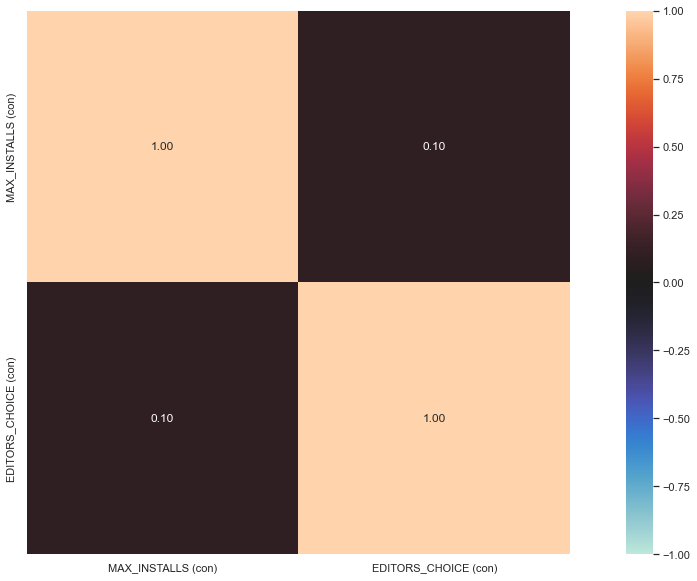

In [51]:
jointDf2 = edited_df[['MAX_INSTALLS','EDITORS_CHOICE']]
nominal.associations(jointDf2, figsize=(20,10), mark_columns=True);

Looks like MAX_INSTALLS correlates editor's choice better than RATING! <br>
(Notice that we are using nominal to figure out the correlation between numerical and categorical variables.)

### MAX INSTALLS VS SIZE

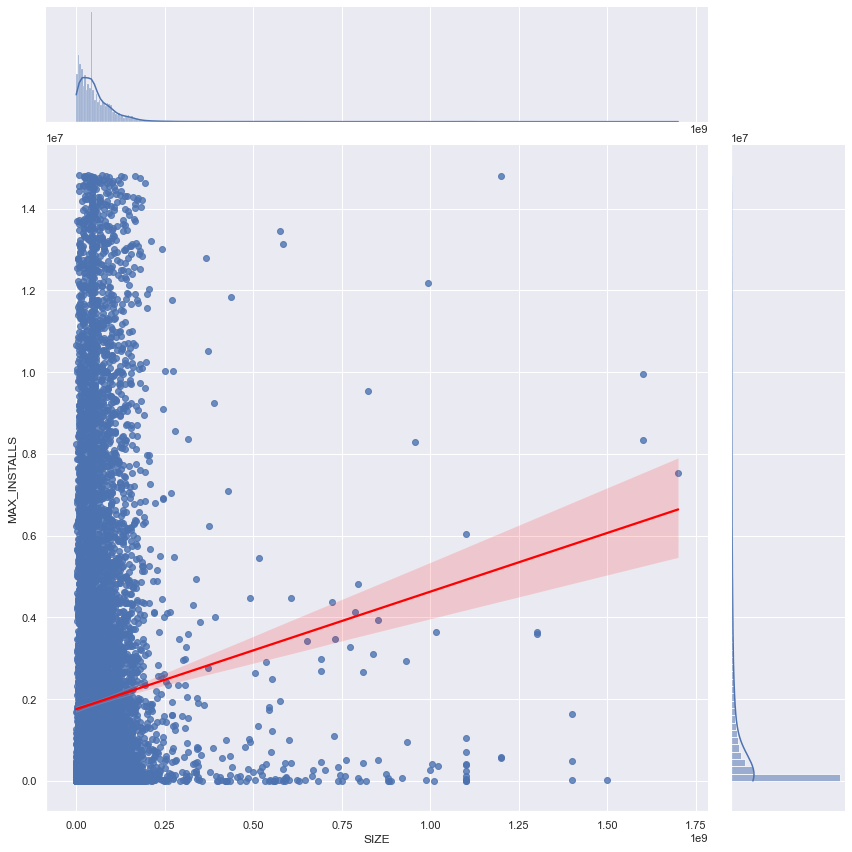

In [52]:
sb.jointplot(data=edited_df, x="SIZE", y="MAX_INSTALLS", kind="reg",  height = 12, line_kws = {"color": "red"})

<AxesSubplot:>

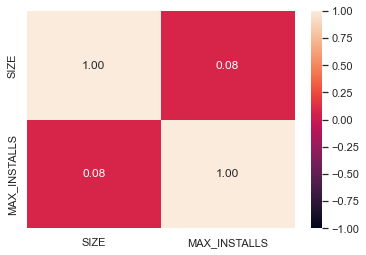

In [53]:
jointDf3 = edited_df[["SIZE", "MAX_INSTALLS"]]
sb.heatmap(jointDf3.corr(), vmin = -1, vmax = 1, annot = True, fmt=".2f")

Size is not a strong variable that contribute to the linear relationship with installs count.

### MAX INSTALLS VS RATING

In [54]:
Rating = edited_df['RATING']
MaxInstall = edited_df['MAX_INSTALLS']
jointDf4 = pd.concat([Rating, MaxInstall], axis = 1)
jointDf4

,RATING,MAX_INSTALLS
0,3.933333,3608
1,4.740000,21680
2,4.434152,9119244
3,4.463476,1209692
4,2.550000,93463
...,...,...
17463,4.000000,1105682
17464,2.986667,1834618
17465,3.840278,10454514
17466,4.200000,200717


In [55]:
fig = px.scatter(jointDf4, x = "MAX_INSTALLS", y = "RATING", marginal_x = "histogram", marginal_y = "histogram")
fig.show() 

It's logical to say that the data are crowded at the top left because that's how the majority trends behaves, if an app is installed commonlly, that might imply that the app is highly-rated.

### MAX INSTALLS & REVIEWS COUNT

In [56]:
findOutliers(df, "REVIEW_COUNT")
findOutliers(df, "MAX_INSTALLS")

REVIEW_COUNT upper limit:  8067.5
MAX_INSTALLS upper limit:  14824491.0


In [57]:
df3 = df[(df['REVIEW_COUNT'] < 8063.75) & (df['MAX_INSTALLS'] < 14822439.125)]
df3

,APP_NAME,RATING,CATEGORY,COLLECTIONS,RATING_COUNT,1_STAR_RATINGS,2_STAR_RATINGS,3_STAR_RATINGS,4_STAR_RATINGS,5_STAR_RATINGS,REVIEW_COUNT,INSTALLS,MIN_INSTALLS,MAX_INSTALLS,FREE,PRICE,SIZE,DEVELOPER,DEVELOPER_ADDRESS,COUNTRY,CONTENT_RATING,AD_SUPPORTED,IN_APP_PURCHASES,EDITORS_CHOICE,DAYS_SINCE_UPDATE,DAYS_SINCE_RELEASED
0,"""Ghost Voice Catcher"" AUTO EVP",3.933333,Lifestyle,topselling_paid,68,12,1,6,7,42,24.0,"1,000+",1000,3608,False,5.99,1100000.0,BIG BEARD Studios,114 1/2 Ash st. Nashua NH 03060,Usa,Everyone,False,False,False,1820,3482
1,"""OXXO""",4.740000,Puzzle,topselling_paid,975,23,0,15,94,843,54.0,"10,000+",10000,21680,False,0.99,81000000.0,Hamster On Coke Games,ul Jugosłowiańska 37F/10\r\n73-110 Stargard Sz...,NaN,Everyone,False,False,False,0,945
2,#DRIVE,4.434152,Racing,topgrossing,229679,9352,4740,15249,47804,152534,6473.0,"5,000,000+",5000000,9119244,True,0.00,132000000.0,Pixel Perfect Dude S.A.,ul. Polna 28/6 lok. 4\r\n62-800 Kalisz\r\nPolska,NaN,Everyone,True,True,False,4,1084
3,#SelfCare,4.463476,Role Playing,topselling_free,14932,865,336,1088,1353,11290,1501.0,"1,000,000+",1000000,1209692,True,0.00,83000000.0,TRU LUV Inc.,"186-720 King Street West\r\nToronto, Ontario, ...",NaN,Teen,False,True,False,952,1275
4,#open Polyamorous + ENM Dating,2.550000,Dating,topselling_free,708,263,163,63,70,149,362.0,"50,000+",50000,93463,True,0.00,19000000.0,#open,NaN,NaN,Mature 17+,False,True,False,17,1026
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
17463,코미코,4.000000,Comics,topgrossing,5626,856,244,611,244,3671,30.0,"1,000,000+",1000000,1105682,True,0.00,31000000.0,NHN Corp.,13487 경기도 성남시 분당구 대왕판교로645번길 16 NHN 플레이뮤지엄\r\n...,NaN,Teen,False,True,False,11,1758
17464,투믹스,2.986667,Comics,topselling_free,6057,1777,646,1050,1050,1534,56.0,"1,000,000+",1000000,1834618,True,0.00,14000000.0,(주)투믹스,"서울특별시 강남구 테헤란로 98길 8, 4층(대치동, KT&G 대치타워)",NaN,Teen,False,True,False,12,1913
17465,피망 뉴맞고: 고스톱 대표 맞고 게임,3.840278,Card,topgrossing,352939,68709,19525,14582,46465,203658,691.0,"10,000,000+",10000000,10454514,True,0.00,85000000.0,NEOWIZ corp,경기도 성남시 분당구 대왕판교로 645번길 14 네오위즈판교타워,South Korea,Teen,True,True,False,21,3186
17466,허기 워기,4.200000,Music,topselling_free,717,143,0,0,0,574,5.0,"100,000+",100000,200717,True,0.00,49000000.0,Dark Horror Game,NaN,NaN,Everyone,True,False,False,100,101


Text(0, 0.5, 'INSTALLATION COUNT')

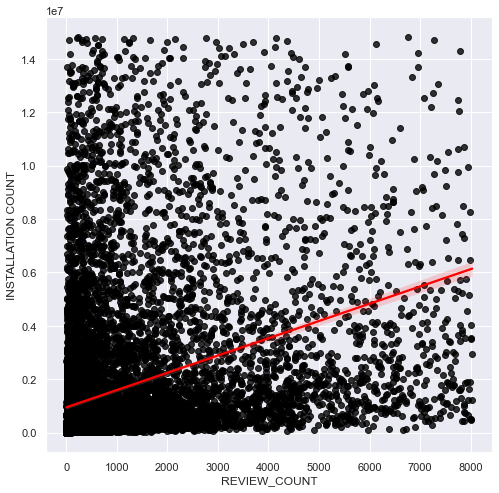

In [58]:
plt.figure(figsize = (8, 8))
sb.regplot(y = "MAX_INSTALLS", x = "REVIEW_COUNT", data = df3, scatter_kws={"color": "black"}, line_kws={"color": "red"})
plt.ylabel("INSTALLATION COUNT")

There's a steady increase on the installation count when the review count increases.

### MAX_INSTALLS VS DAYS_SINCE_RELEASED

In [59]:
jointDf = edited_df[['DAYS_SINCE_RELEASED', 'MAX_INSTALLS']]
jointDf

,DAYS_SINCE_RELEASED,MAX_INSTALLS
0,3482,3608
1,945,21680
2,1084,9119244
3,1275,1209692
4,1026,93463
...,...,...
17463,1758,1105682
17464,1913,1834618
17465,3186,10454514
17466,101,200717


In [60]:
fig = px.box(jointDf, x = "DAYS_SINCE_RELEASED")
fig.show()

In [61]:
fig = px.histogram(jointDf, x = "DAYS_SINCE_RELEASED")
fig.show()

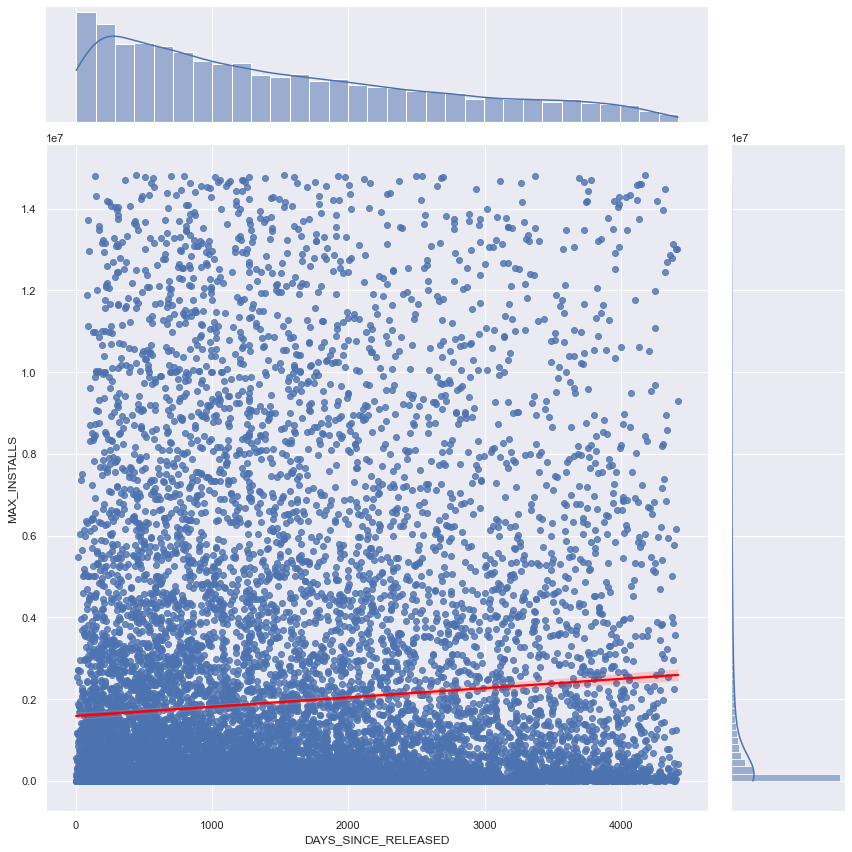

In [62]:
sb.jointplot(data = jointDf, x = "DAYS_SINCE_RELEASED", y = "MAX_INSTALLS", kind='reg',line_kws={"color":"red"}, height = 12)

We are done with exploring installation count. We shall move on to our next chapter.
## RATING EDA
### What is the rating distribution like on Google PlayStore? 

In [63]:
Ratings = df[['1_STAR_RATINGS','2_STAR_RATINGS','3_STAR_RATINGS','4_STAR_RATINGS','5_STAR_RATINGS']]
RatingsCount = pd.DataFrame(Ratings.sum(axis=0))
RatingsCount.columns = ['Count']
fig = px.bar(RatingsCount, x='Count')
fig.show()


### Let's find the average rating of an app.


In [64]:
fig = px.histogram(df, x = "RATING")
print("The average rating of an app is: ", df['RATING'].mean())
fig.show()

The average rating of an app is:  4.1587440980651404


### RATING VS EDITOR'S CHOICE
Let's add a hue to helps us infer the proportion of editor's choice in each bin of rating of the above histogram.

In [65]:
fig = px.histogram(df, x = "RATING", color = "EDITORS_CHOICE")
fig.show()

### Let's try another approach for visualizing the relationship between rating and editors choice.

In [66]:
fig = px.box(df, x = "RATING", color = "EDITORS_CHOICE")
fig.show()

It seems like we can be confident that those with rating < 3 are not editor's choice. But from rating > 4 onwards, we can't make accurate prediction from what we have now. 

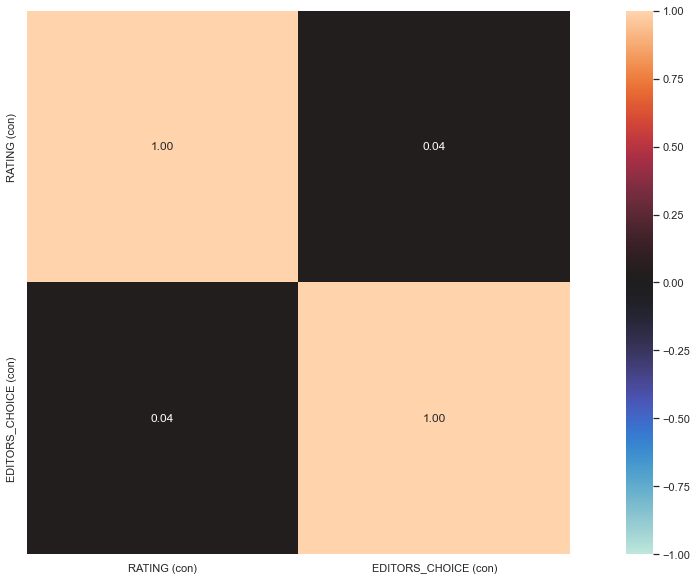

In [67]:
jointDf1 = df[['RATING','EDITORS_CHOICE']]
nominal.associations(jointDf1,figsize=(20,10),mark_columns=True);

The correlation is unexpectedly low between these 2 variables.<br> Because we normally assume if an app is classified as an editor's choice, then the rating might be high. <br>We need to search for variables that have stronger linear relationship to help with our prediction.
<br><br>
Dython will automatically find which features are categorical and which are numerical, compute a relevant measure of association between each and every feature, and plot it all as an easy-to-read heat-map. <br>
It will then calculate the correlation/strength-of-association of features in data-set with both categorical and continuous features.

### RATING VS FREE

What's the distribution of free apps and paid apps?

In [68]:
fig = px.histogram(df, x = "FREE")
fig.show()

In [69]:
fig = px.box(df, x = "RATING", color = "FREE")
fig.show()

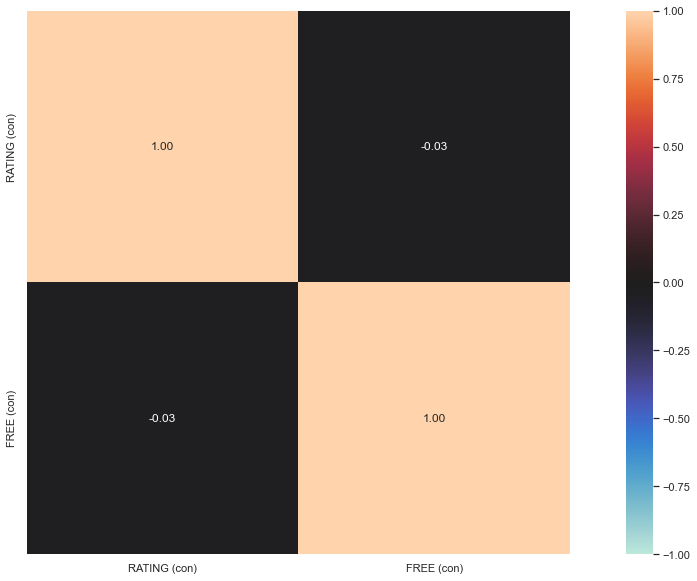

In [70]:
jointDf4 = df[['RATING','FREE']]
nominal.associations(jointDf4,figsize=(20,10),mark_columns=True);

In [71]:
df['PRICE'].value_counts().head(20)

0.00     13912
2.99       513
1.99       460
0.99       455
4.99       402
3.99       321
1.49       152
9.99       138
5.99       132
2.49       129
6.99       127
3.49       106
7.99        65
4.49        54
5.49        42
14.99       39
19.99       33
8.99        23
11.99       22
24.99       20
Name: PRICE, dtype: int64

### What are the expensive apps?

In [72]:
df.sort_values(by = "PRICE", ascending = False).head(5)

,APP_NAME,RATING,CATEGORY,COLLECTIONS,RATING_COUNT,1_STAR_RATINGS,2_STAR_RATINGS,3_STAR_RATINGS,4_STAR_RATINGS,5_STAR_RATINGS,REVIEW_COUNT,INSTALLS,MIN_INSTALLS,MAX_INSTALLS,FREE,PRICE,SIZE,DEVELOPER,DEVELOPER_ADDRESS,COUNTRY,CONTENT_RATING,AD_SUPPORTED,IN_APP_PURCHASES,EDITORS_CHOICE,DAYS_SINCE_UPDATE,DAYS_SINCE_RELEASED
15369,Ultimate Baccarat From BeatTheCasino.com,5.000000,Productivity,topgrossing,7,0,0,0,0,7,4.0,10+,10,46,False,397.00,1900000.0,BeatTheCasino.com,BOX 863\r\nMechanicsburg PA 17055,NaN,Everyone,False,False,False,20,182
16241,Wheel It Off,4.222222,Maps & Navigation,topgrossing,9,1,0,0,3,5,4.0,50+,50,88,False,199.99,22000000.0,"Blue Blink One, SL","Av. Del Mar, 55, 3\r\n12003 Castellon\r\nSpain",NaN,Everyone,False,False,False,170,2799
14142,Synthesis Homeopathic Repertory (Eng) - Schroyens,4.800000,Medical,topgrossing,38,0,0,0,7,31,2.0,500+,500,555,False,134.99,45000000.0,ZEUS SOFT sprl,ZEUS SOFT sprl\r\nParc Crealys\r\nBâtiment Eri...,NaN,Everyone,False,True,False,132,2703
9922,NVH For Android,4.272728,Auto & Vehicles,topselling_paid,29,4,1,0,1,23,20.0,500+,500,885,False,99.99,76000000.0,"Vibrate Software, Inc.","1646 West 250 North\r\nLayton, Utah, 84041 U.S.A",NaN,Everyone,False,False,False,20,1650
15602,Vargo Anesthesia Mega App,4.810000,Medical,topselling_paid,144,2,0,2,10,130,61.0,"5,000+",5000,5401,False,99.99,52000000.0,Matt Vargo,www.vargoanesthesia.com,NaN,Everyone,False,False,False,8,2944


### Create categories for price

In [73]:
df.loc[ df['PRICE'] == 0, 'PriceBand'] = 'Free'
df.loc[(df['PRICE'] > 0) & (df['PRICE'] <= 0.99), 'PriceBand'] = 'cheap'
df.loc[(df['PRICE'] > 0.99) & (df['PRICE'] <= 2.99), 'PriceBand']   = 'not cheap'
df.loc[(df['PRICE'] > 2.99) & (df['PRICE'] <= 4.99), 'PriceBand']   = 'normal'
df.loc[(df['PRICE'] > 4.99) & (df['PRICE'] <= 14.99), 'PriceBand']   = 'expensive'
df.loc[(df['PRICE'] > 14.99) & (df['PRICE'] <= 29.99), 'PriceBand']   = 'too expensive'
df.loc[(df['PRICE'] > 29.99), 'PriceBand']  = 'FXXXing expensive'
df[['PriceBand', 'RATING']].groupby(['PriceBand']).mean()

,RATING
PriceBand,
FXXXing expensive,3.978817
Free,4.150193
cheap,4.111748
expensive,4.217975
normal,4.205860
not cheap,4.203709
too expensive,4.175401


Text(0.5, 1.0, 'Rating VS PriceBand')

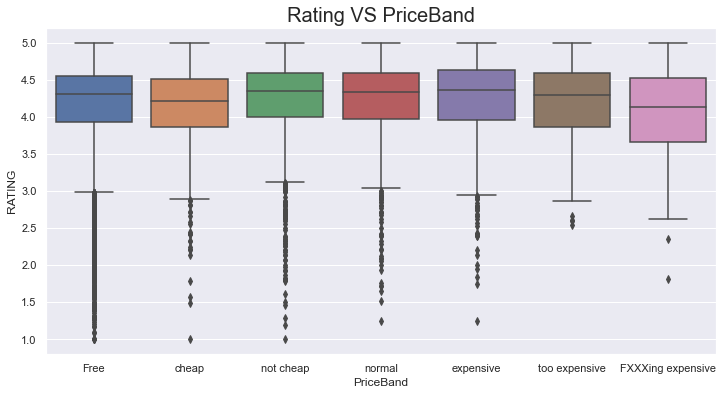

In [74]:
f = plt.figure(figsize=(12, 6))
ORDER = ["Free", "cheap", "not cheap", "normal", "expensive", "too expensive", "FXXXing expensive"]
price = sb.boxplot(x = "PriceBand", y = "RATING", data = df, order = ORDER)
plt.title("Rating VS PriceBand", size = 20)

Let's count the outliers for each category.

In [75]:
def countOutliers2(frame, col, category):
    temp_frame = frame[frame["PriceBand"] == category]
    Q1 = temp_frame[col].quantile(0.25)
    Q3 = temp_frame[col].quantile(0.75)
    IQR = Q3-Q1
    upp_lim = Q3 + 1.5*IQR
    low_lim = Q1 - 1.5*IQR
    count = 0;
    for x in temp_frame[col]:
        if ((x > upp_lim) or (x < low_lim)): count += 1;
    print(f"There is {count} outliers of \"{category}\" apps.")

In [76]:
for x in ORDER: #ORDER is the array of the price categories.
    countOutliers2(df, "RATING", x)

There is 777 outliers of "Free" apps.
There is 23 outliers of "cheap" apps.
There is 88 outliers of "not cheap" apps.
There is 43 outliers of "normal" apps.
There is 29 outliers of "expensive" apps.
There is 4 outliers of "too expensive" apps.
There is 2 outliers of "FXXXing expensive" apps.


In [77]:
fig = px.histogram(df, x = "RATING",color = "FREE")
fig.show()

We finally found our first negatively correlated variable!

### RATING VS AD_SUPPORTED

In [78]:
fig = px.histogram(df, x = "AD_SUPPORTED")
fig.show()

Suprisingly, the distribution between these 2 are very even, and it's beneficial to our machine learning later.

In [79]:
fig = px.box(df, x = "RATING", color = "AD_SUPPORTED")
fig.show()

In [80]:
fig = px.histogram(df, x = "RATING",color = "AD_SUPPORTED")
fig.show()

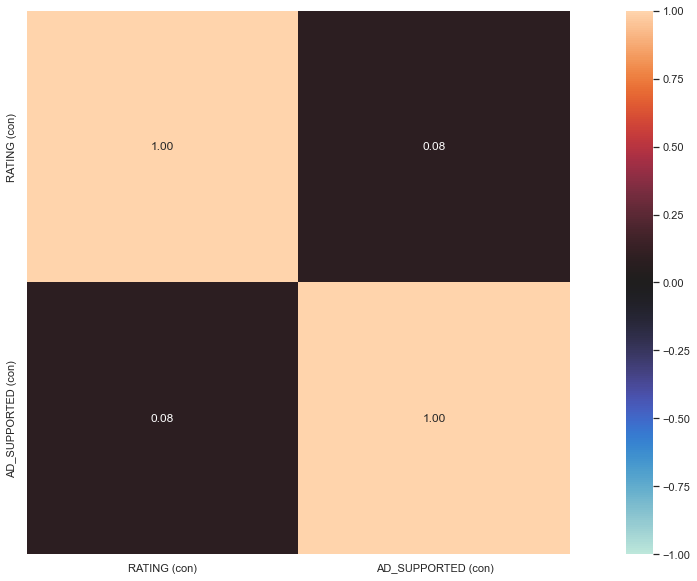

In [81]:
jointDf5 = df[['RATING','AD_SUPPORTED']]
nominal.associations(jointDf5,figsize=(20,10),mark_columns=True);

Relatively speaking, AD_SUPPORTED is a fine variable correlated with RATING, but still the value is too low.

### RATING VS CONTENT RATING 

Everyone           12668
Teen                2929
Everyone 10+         989
Mature 17+           856
Adults only 18+       27
Name: CONTENT_RATING, dtype: int64


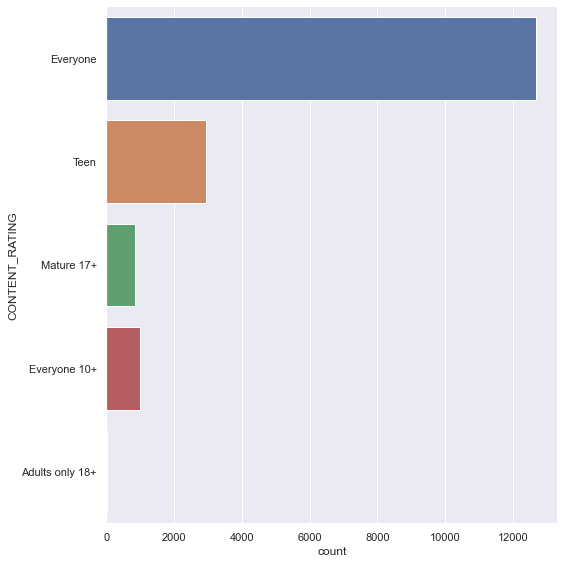

In [82]:
print(df["CONTENT_RATING"].value_counts())
sb.catplot(y = "CONTENT_RATING", data = df, kind = "count", height = 8)

In [83]:
fig = px.box(df, x = "RATING", color = "CONTENT_RATING")
fig.show()

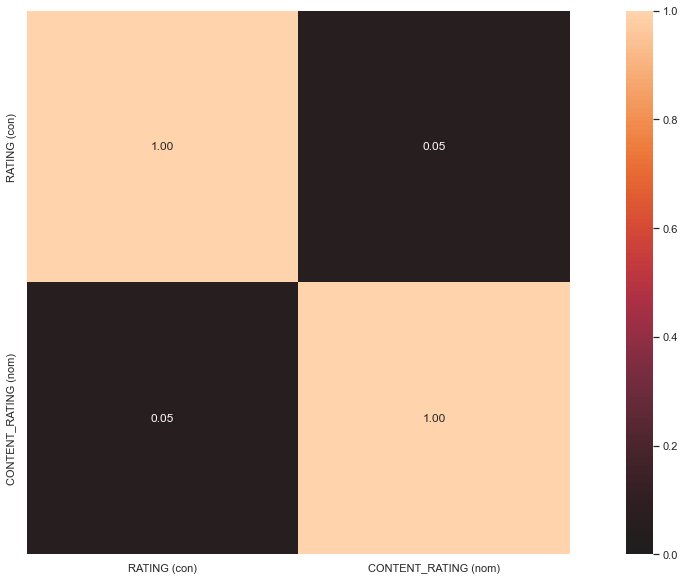

In [84]:
jointDf6 = df[['RATING','CONTENT_RATING']]
nominal.associations(jointDf6,figsize=(20,10),mark_columns=True);

Let's repeat the same steps on our cleaned dataset!

Everyone           10836
Teen                2384
Everyone 10+         794
Mature 17+           741
Adults only 18+       27
Name: CONTENT_RATING, dtype: int64


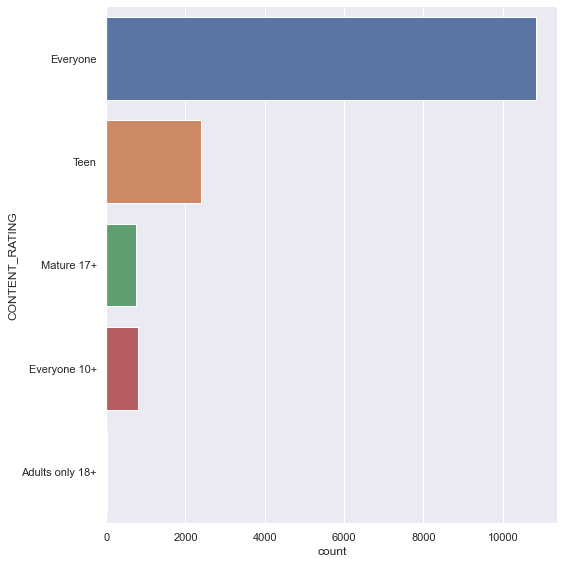

In [85]:
print(edited_df["CONTENT_RATING"].value_counts())
sb.catplot(y = "CONTENT_RATING", data = edited_df, kind = "count", height = 8)

In [86]:
fig = px.box(edited_df, x = "MAX_INSTALLS", color = "CONTENT_RATING")
fig.show()

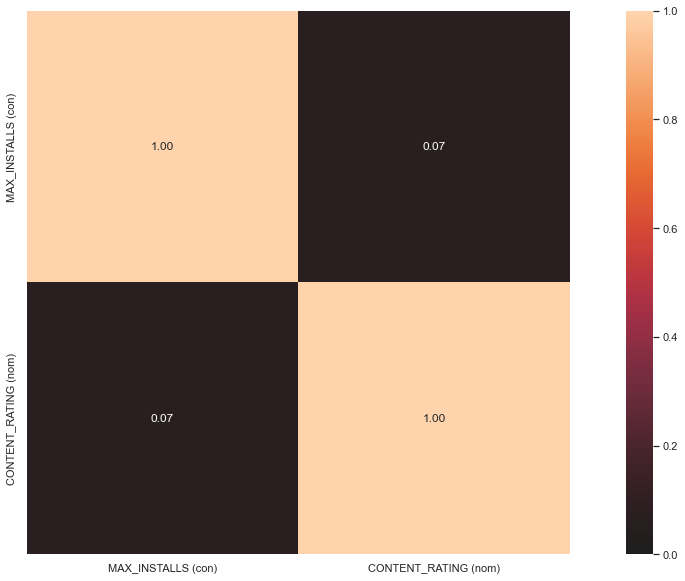

In [87]:
jointDf7 = edited_df[['MAX_INSTALLS','CONTENT_RATING']]
nominal.associations(jointDf7,figsize=(20,10),mark_columns=True);

There's a subtle improvement in our correlation value.

### RATING VS IN_APP_PURCHASES 

In [88]:
fig = px.histogram(df, x = "IN_APP_PURCHASES")
fig.show()

In [89]:
fig = px.histogram(df, x = "RATING",color = "IN_APP_PURCHASES")
fig.show()

In [90]:
fig = px.box(df, x = "RATING", color = "IN_APP_PURCHASES")
fig.show()

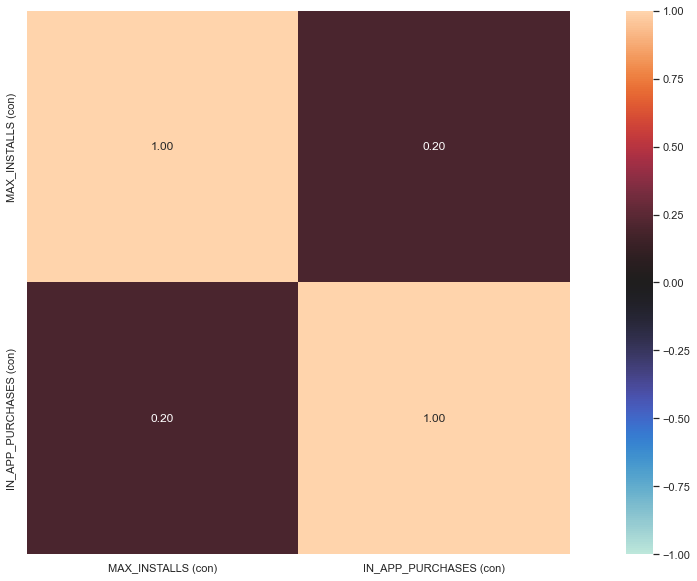

In [91]:
jointdf8 = edited_df[['MAX_INSTALLS','IN_APP_PURCHASES']]
nominal.associations(jointdf8,figsize=(20,10),mark_columns=True);

This is by far the best variable we can use to predict our installation count! Which makes alot of sense, is ad-supported. Means that they have the income to make their game better. 

### RATING VS DAYS_SINCE_UPDATE

In [92]:
jointDf8 = df[['DAYS_SINCE_UPDATE', 'RATING']]
jointDf8

,DAYS_SINCE_UPDATE,RATING
0,1820,3.933333
1,0,4.740000
2,4,4.434152
3,952,4.463476
4,17,2.550000
...,...,...
17464,12,2.986667
17465,21,3.840278
17466,100,4.200000
17467,1,3.733209


In [93]:
fig = px.box(jointDf8, x = "DAYS_SINCE_UPDATE")
fig.show()

In [94]:
fig = px.histogram(jointDf8, x = "DAYS_SINCE_UPDATE")
fig.show()

You might think this is a very skewed data. But in fact, it's very logical. Because apps should be updated frequently, hence the "lower days" section will be more crowded. BUT!
Let's remove the outliers~

In [95]:
countOutliers(jointDf8, "DAYS_SINCE_UPDATE")
findOutliers(jointDf8, "DAYS_SINCE_UPDATE")

There is 2462 outliers in "DAYS_SINCE_UPDATE" field.
DAYS_SINCE_UPDATE upper limit:  423.5


In [96]:
edited_df = df.copy()
edited_df = edited_df[edited_df['DAYS_SINCE_UPDATE'] < 423.5]
jointDf = edited_df[['DAYS_SINCE_UPDATE', 'RATING']]
jointDf

,DAYS_SINCE_UPDATE,RATING
1,0,4.740000
2,4,4.434152
4,17,2.550000
5,3,3.200000
6,154,4.751634
...,...,...
17464,12,2.986667
17465,21,3.840278
17466,100,4.200000
17467,1,3.733209


In [97]:
fig = px.box(jointDf, x = "DAYS_SINCE_UPDATE")
fig.show()

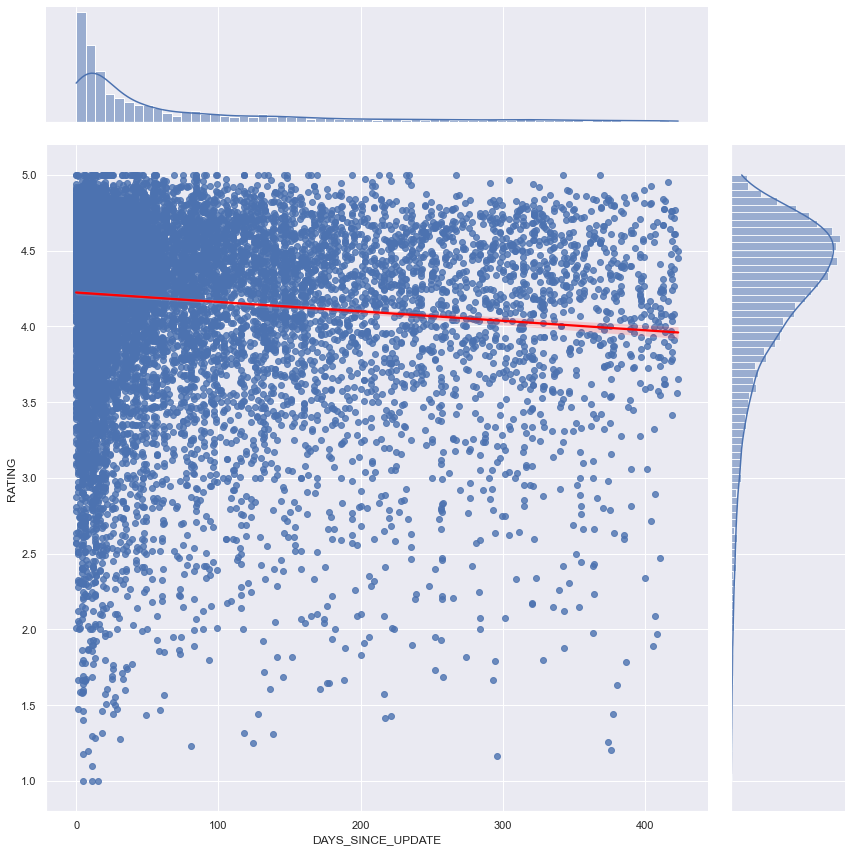

In [98]:
sb.jointplot(data=jointDf, x="DAYS_SINCE_UPDATE", y="RATING", kind="reg", line_kws={"color": "red"}, height = 12)

This means that if the longer it took since the last update, we are expecting the app to have a lower rating due to low maintenance of the app.

### Category EDA

What are the most populated app in Google PlayStore? How many sports app do we have in this dataset?

In [99]:
fig = px.histogram(df, x="CATEGORY").update_xaxes(categoryorder = "total descending")
fig.update_layout(
    width=1500,
    height=500,
)
fig.show()

We do realise there're some category objects that have more than 1 category, let's deal with those.

### Performance for each category

In [100]:
fig = px.box(edited_df, x = "RATING", color = "CATEGORY")
fig.update_layout(
    width=1000,
    height=1200,
    margin=dict(l=20, r=40, t=20, b=20),
    paper_bgcolor="LightSteelBlue",
)
fig.show()

### Distribution of review count

Text(0.5, 1.0, 'Distribution of Review Count')

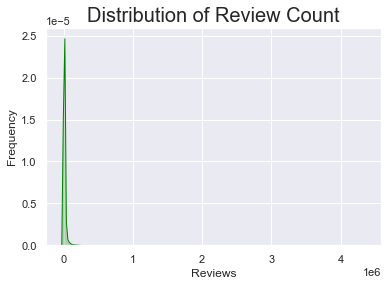

In [101]:
f = sb.kdeplot(df['REVIEW_COUNT'], color="Green", shade = True)
f.set_xlabel("Reviews")
f.set_ylabel("Frequency")
plt.title('Distribution of Review Count',size = 20)

This graph so skewed! We need to clean it by removing outliers.

In [102]:
findOutliers(df, "REVIEW_COUNT")

REVIEW_COUNT upper limit:  8067.5


In [103]:
edited_df3 = df.copy()
edited_df3 = edited_df3[edited_df3['REVIEW_COUNT'] < 8067.5]

Text(0.5, 1.0, 'Distribution of Review Counts')

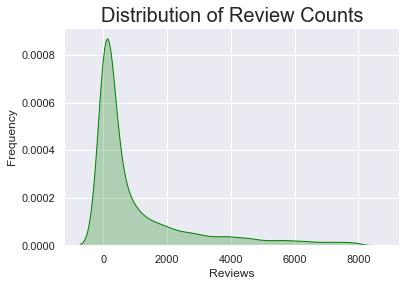

In [104]:
f = sb.kdeplot(edited_df3['REVIEW_COUNT'], color="Green", shade = True)
f.set_xlabel("Reviews")
f.set_ylabel("Frequency")
plt.title('Distribution of Review Counts',size = 20)

Now, that's more like it. A better presentation of how many reviews get. Although it's still positively skewed...

### RATING VS REVIEW COUNTS

Text(0.5, 1.0, 'Rating VS Reviews Counts')

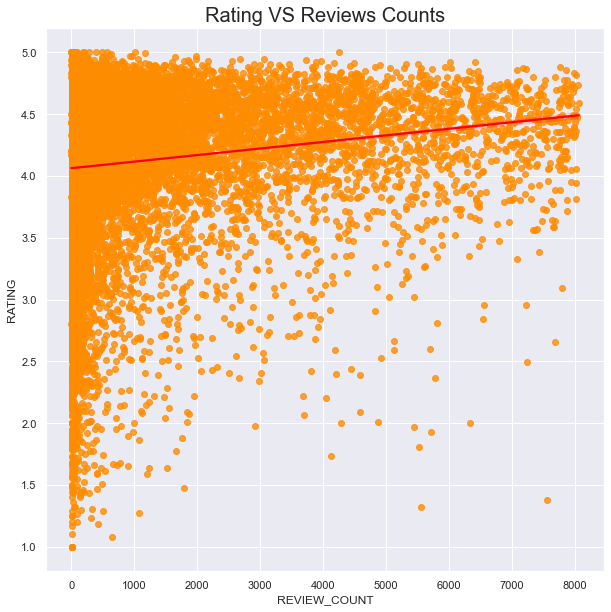

In [105]:
plt.figure(figsize = (10,10))
sb.regplot(x="REVIEW_COUNT", y="RATING", color = 'darkorange',data=edited_df3, line_kws={"color":"red"});
plt.title('Rating VS Reviews Counts',size = 20)

<AxesSubplot:>

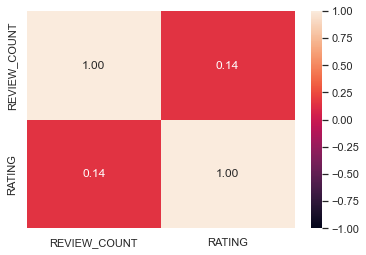

In [106]:
jointDf = edited_df3[['REVIEW_COUNT', 'RATING']]
sb.heatmap(jointDf.corr(), vmin = -1, vmax = 1, annot = True, fmt=".2f")

There's a positive relationship between these 2 relationship between rating and review count.

### SIZE EDA

In [107]:
def num_plots(df, col, title, xlabel):
    fig, ax = plt.subplots(2, 1, sharex=True, figsize=(12,5),gridspec_kw={"height_ratios": (.2, .8)})
    ax[0].set_title(title,fontsize=18)
    sb.boxplot(x=col, data=df, ax=ax[0])
    ax[0].set(yticks=[])
    sb.histplot(x=col, data=df, ax=ax[1], bins = 50)
    ax[1].set_xlabel(xlabel, fontsize=16)
    plt.tight_layout()
    plt.show()

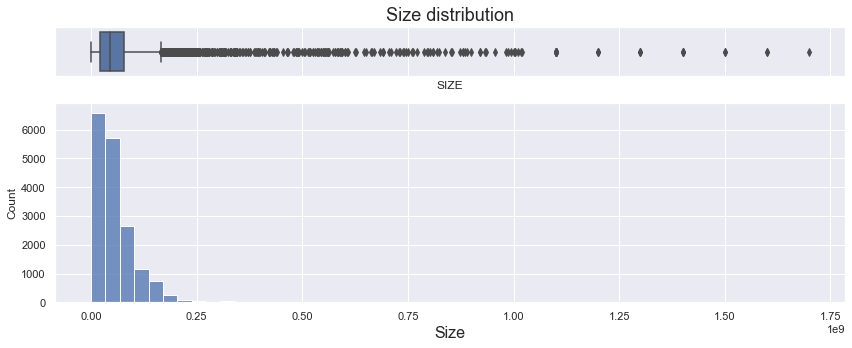

In [108]:
num_plots(df, 'SIZE', 'Size distribution', 'Size')

Text(0.5, 1.0, 'Rating VS Size')

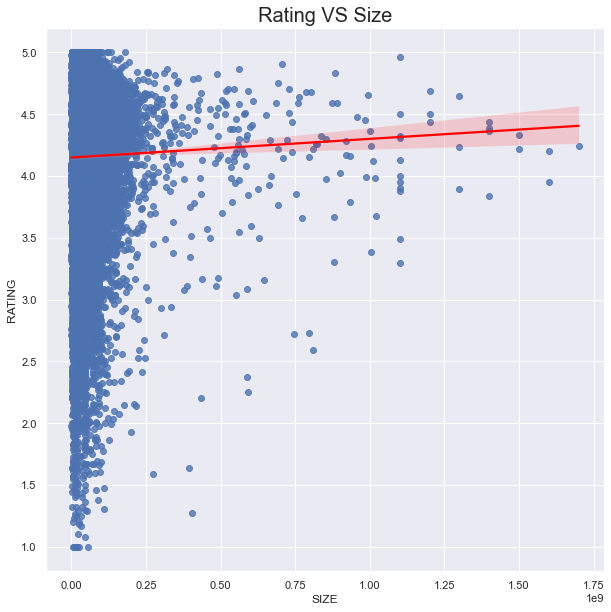

In [109]:
plt.figure(figsize = (10,10))
sb.regplot(x="SIZE", y="RATING", data=df, line_kws={"color":"red"});
plt.title('Rating VS Size',size = 20)

Remove outliers.

In [110]:
findOutliers(df, "SIZE")

SIZE upper limit:  165000000.0


In [111]:
edited_df = df[df['SIZE'] < 165000000.0]

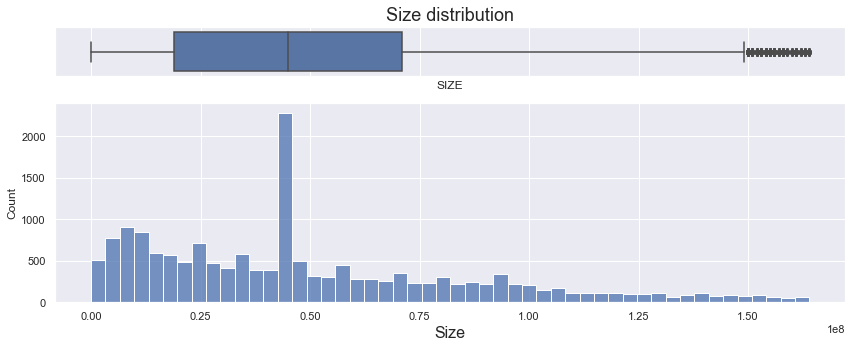

In [112]:
num_plots(edited_df, 'SIZE', 'Size distribution', 'Size')

Text(0.5, 1.0, 'Rating VS Size')

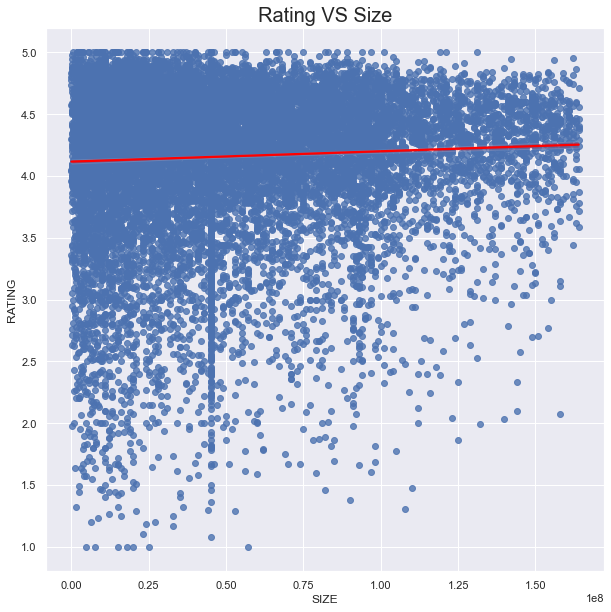

In [113]:
plt.figure(figsize = (10,10))
sb.regplot(x="SIZE", y="RATING", data=edited_df, line_kws={"color":"red"});
plt.title('Rating VS Size',size = 20)

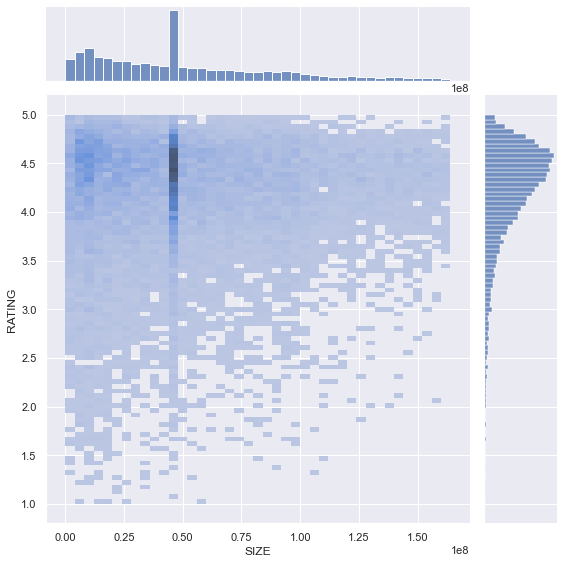

In [114]:
sb.jointplot(data = edited_df, x = "SIZE", y = "RATING", height = 8, kind = "hist")

In this dataset, we have the most frequent data are those around 50 MB and it's rated around 4.50.

<AxesSubplot:>

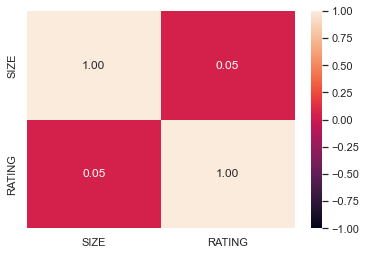

In [115]:
jointDf = edited_df[['SIZE', 'RATING']]
sb.heatmap(jointDf.corr(), vmin = -1, vmax = 1, annot = True, fmt=".2f")

Looks like it's almost not correlated at all. But it's kind of intuitive right? Normally people wouldn't rate an app based on its size. 

### Singapore EDA

In [116]:
sg = df.loc[df['COUNTRY'] == 'Singapore']
sg

,APP_NAME,RATING,CATEGORY,COLLECTIONS,RATING_COUNT,1_STAR_RATINGS,2_STAR_RATINGS,3_STAR_RATINGS,4_STAR_RATINGS,5_STAR_RATINGS,REVIEW_COUNT,INSTALLS,MIN_INSTALLS,MAX_INSTALLS,FREE,PRICE,SIZE,DEVELOPER,DEVELOPER_ADDRESS,COUNTRY,CONTENT_RATING,AD_SUPPORTED,IN_APP_PURCHASES,EDITORS_CHOICE,DAYS_SINCE_UPDATE,DAYS_SINCE_RELEASED,PriceBand
36,1942 🚀 Free classic shooting games,4.587898,Arcade,topgrossing,73531,3418,1592,3184,5478,59859,5305.0,"5,000,000+",5000000,8991266,True,0.0,45000000.0,OneSoft Global PTE. LTD.,"470 NORTH BRIDGE ROAD, SINGAPORE",Singapore,Everyone,True,True,False,488,1461,Free
37,1945 Air Force: Airplane games,4.698587,Arcade,topgrossing,1952163,48977,19288,61575,211427,1610896,34945.0,"100,000,000+",100000000,112131352,True,0.0,190000000.0,ONESOFT,"470 NORTH BRIDGE ROAD, SINGAPORE",Singapore,Everyone 10+,True,True,False,10,1099,Free
72,2nd phone number - call & sms,3.250000,Communication,topgrossing,13226,5031,648,0,1048,6499,264.0,"1,000,000+",1000000,4492802,True,0.0,24000000.0,High-quality Internet call,"10 Eunos Road 8, 01-123",Singapore,Everyone,True,True,False,112,949,Free
118,456 Survival Challenge,4.197674,Action,topselling_free,70831,8599,2741,4022,6131,49338,655.0,"10,000,000+",10000000,18331140,True,0.0,57000000.0,Azura Global,"Pulau Tekong, Singapore",Singapore,Teen,True,False,False,99,144,Free
123,4Fun Lite - Live Chat Room,4.100000,Social,topgrossing,40144,7953,0,757,2272,29162,74.0,"10,000,000+",10000000,14874675,True,0.0,79000000.0,SpreadFun,3 FRASER STREET， 05-25，DUO TOWER，SINGAPORE,Singapore,Mature 17+,True,True,False,15,592,Free
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
16455,Word Connect - Fun Word Game,4.739130,Word,topselling_free,6647,95,30,111,1027,5384,1657.0,"100,000+",100000,408445,True,0.0,25000000.0,Classic Puzzzle Games Studio,164 Canberra Drive The Brownstone 768001,Singapore,Everyone,True,False,False,5,448,Free
16843,Yugto,4.630769,Books & Reference,topgrossing,53165,1227,395,3057,7363,41123,430.0,"1,000,000+",1000000,4100184,True,0.0,26000000.0,Dreame Media,"11 WOODLANDS CLOSE 08-20, SINGAPORE",Singapore,Teen,False,True,False,84,461,Free
16925,Zombie War Idle Defense Game,4.448276,Casual,topgrossing,38747,3435,1145,1336,1527,31304,591.0,"5,000,000+",5000000,7033818,True,0.0,131000000.0,OneSoft Global PTE. LTD.,"470 NORTH BRIDGE ROAD, SINGAPORE",Singapore,Everyone 10+,True,True,False,4,467,Free
17125,"iQIYI-Drama, Anime, Show",4.456103,Entertainment,topgrossing,829481,82545,15040,18621,38139,675136,2913.0,"50,000,000+",50000000,52838429,True,0.0,45000000.0,iQIYI,"6 SHENTON WAY, 33-00, OUE DOWNTOWN, SINGAPORE",Singapore,Everyone,True,True,False,7,1020,Free


In [117]:
print("Number of games in Singapore:",len(sg))
print("Number of developers in Singapore:",len(sg["DEVELOPER"].unique()))

Number of games in Singapore: 205
Number of developers in Singapore: 107


It seems like there are developers that created more than one app. Let's find out which developer has the most number of apps developed.

In [118]:
temp = sg.groupby(['DEVELOPER']).size().reset_index(name='COUNT').sort_values(by = 'COUNT', ascending = False)
temp

,DEVELOPER,COUNT
3,AMANOTES PTE LTD,17
61,OneSoft Global PTE. LTD.,14
48,LIHUHU PTE. LTD.,11
23,Dreame Media,8
14,Century Games Pte. Ltd.,7
...,...,...
55,Mods for Minecraft PE by Arata Kenshin,1
54,Modo Global,1
1,ACNGames,1
17,Commandoo Jsc,1


There are 287 apps developed in Singapore. Let's choose the top 20 apps by rating and installs in Singapore.<br>
First, we sort the singapore dataset by installation count and rating.<br>
Then, we take the top 20.

In [119]:
sg_top_20_rated = sg.sort_values(["MAX_INSTALLS", "RATING"], ascending = False)
sg_top_20_rated = sg_top_20_rated.head(20)
sg_top_20_rated

,APP_NAME,RATING,CATEGORY,COLLECTIONS,RATING_COUNT,1_STAR_RATINGS,2_STAR_RATINGS,3_STAR_RATINGS,4_STAR_RATINGS,5_STAR_RATINGS,REVIEW_COUNT,INSTALLS,MIN_INSTALLS,MAX_INSTALLS,FREE,PRICE,SIZE,DEVELOPER,DEVELOPER_ADDRESS,COUNTRY,CONTENT_RATING,AD_SUPPORTED,IN_APP_PURCHASES,EDITORS_CHOICE,DAYS_SINCE_UPDATE,DAYS_SINCE_RELEASED,PriceBand
12461,SHAREit: Share & File Manager,4.156039,Tools,topselling_free,16968065,2637001,496300,690263,902531,12241970,50315.0,"1,000,000,000+",1000000000,1810333419,True,0.0,51000000.0,Smart Media4U Technology Pte.Ltd.,2 VENTURE DRIVE 11-30 VISION EXCHANGE SINGAPO...,Singapore,Everyone,True,False,False,1,3236,Free
5855,Garena Free Fire - Illuminate,3.921184,Action,topselling_free,106026036,23983506,2183863,3267671,5361237,71229759,529596.0,"1,000,000,000+",1000000000,1183906520,True,0.0,45000000.0,Garena International I,"1 FUSIONOPOLIS PLACE, 17-10, GALAXIS, Singapore",Singapore,Mature 17+,False,True,False,27,1552,Free
10579,PUBG MOBILE: Aftermath,4.100975,Action,topselling_free,41487293,7662376,839578,1185130,1759563,30040646,795150.0,"500,000,000+",500000000,600285723,True,0.0,45000000.0,Level Infinite,10 ANSON ROAD 21-07 INTERNATIONAL PLAZA SING...,Singapore,Teen,True,True,True,55,1450,Free
8604,Magic Tiles 3,3.935281,Music,topselling_free,2832992,447567,142573,222086,354141,1666625,95367.0,"100,000,000+",100000000,484629075,True,0.0,45000000.0,AMANOTES PTE LTD,"24-09 SBF Center, 160 Robinson Road, Singapor...",Singapore,Everyone,True,True,False,11,1838,Free
14797,Tiles Hop: EDM Rush!,4.168087,Music,topgrossing,3011736,372687,115026,176130,317346,2030547,77783.0,"100,000,000+",100000000,448568681,True,0.0,108000000.0,AMANOTES PTE LTD,"24-09 SBF Center, 160 Robinson Road, Singapor...",Singapore,Teen,True,True,False,17,1512,Free
1496,BeautyPlus-Snap Retouch Filter,4.486609,Photography,topselling_free,4814233,354684,91864,164614,447888,3755183,30404.0,"100,000,000+",100000000,430106338,True,0.0,219000000.0,PIXOCIAL TECHNOLOGY (SINGAPORE) PTE. LTD.,"80 Robinson Road 02-00, Singapore 068898",Singapore,Everyone,True,True,False,4,3159,Free
15947,"WPS Office-PDF,Word,Excel,PPT",4.315896,Productivity,topselling_free,3742515,355120,95942,204036,443824,2643593,56023.0,"100,000,000+",100000000,428810135,True,0.0,126000000.0,WPS SOFTWARE PTE. LTD.,6 RAFFLES QUAY 14-06 SINGAPORE,Singapore,Everyone,True,True,False,11,3883,Free
16109,WeChat,3.748641,Communication,topgrossing,6103916,1400688,216129,380447,626143,3480509,212964.0,"100,000,000+",100000000,366352173,True,0.0,396000000.0,WeChat International Pte. Ltd.,"10 Anson Rd, 21-07, International Plaza, Sing...",Singapore,Everyone,False,True,False,11,4055,Free
10553,PLAYit-All in One Video Player,4.642533,Video Players & Editors,topselling_free,3729916,174007,52639,112895,253109,3137266,13610.0,"100,000,000+",100000000,265228236,True,0.0,28000000.0,PLAYIT TECHNOLOGY PTE. LTD.,"60 PAYA LEBAR ROAD, 08-10,PAYA LEBAR SQUARE, S...",Singapore,Everyone,True,True,False,11,851,Free
6440,"Hago-Talk, Live & Play Games",4.256812,Social,topgrossing,6045675,560542,157685,504453,767615,4055380,6078.0,"100,000,000+",100000000,257141759,True,0.0,45000000.0,HAGO,8 TEMASEK BOULEVARD 08-05 SUNTEC TOWER THREE ...,Singapore,Mature 17+,True,True,False,14,1267,Free


### Singapore Top performing developers

We will determine the reputation of a developer by evaluating their sum of all of their application's max installation count and average rating of each application.

In [120]:
data2 = sg[["APP_NAME", "DEVELOPER", "RATING", "MAX_INSTALLS"]]
data2

,APP_NAME,DEVELOPER,RATING,MAX_INSTALLS
36,1942 🚀 Free classic shooting games,OneSoft Global PTE. LTD.,4.587898,8991266
37,1945 Air Force: Airplane games,ONESOFT,4.698587,112131352
72,2nd phone number - call & sms,High-quality Internet call,3.250000,4492802
118,456 Survival Challenge,Azura Global,4.197674,18331140
123,4Fun Lite - Live Chat Room,SpreadFun,4.100000,14874675
...,...,...,...,...
16455,Word Connect - Fun Word Game,Classic Puzzzle Games Studio,4.739130,408445
16843,Yugto,Dreame Media,4.630769,4100184
16925,Zombie War Idle Defense Game,OneSoft Global PTE. LTD.,4.448276,7033818
17125,"iQIYI-Drama, Anime, Show",iQIYI,4.456103,52838429


In [121]:
avg_rating = data2.groupby(["DEVELOPER"])["RATING"].mean().to_frame()
sum_installs = data2.groupby(["DEVELOPER"])["MAX_INSTALLS"].sum().to_frame()
sg_dev = pd.merge(avg_rating, sum_installs, on = "DEVELOPER")
sg_dev

,RATING,MAX_INSTALLS
DEVELOPER,,
2021 Yearly Selection Cloud Gaming - Netboom Ltd.,4.888230,19820120
ACNGames,4.384416,741785
AI Palm Scanner Cartoon Face App Studio,3.336134,1265037
AMANOTES PTE LTD,4.119950,1392750556
Abtalk Call,4.319527,33297044
...,...,...
iCuisto Pte Ltd,4.220000,141579
iQIYI,4.456103,52838429
igo team,3.990000,5504555


In [122]:
sg_dev.sort_values(["RATING", "MAX_INSTALLS"], ascending = False).head(20)

,RATING,MAX_INSTALLS
DEVELOPER,,
2021 Yearly Selection Cloud Gaming - Netboom Ltd.,4.888230,19820120
PLAYNEXX GAMES,4.842593,500701
SM Health Team,4.841572,5633058
BOUNCE ENTERTAINMENT COMPANY LIMITED,4.830189,204942
DB RR STUDIO,4.825671,5796815
AlphaPlay Games,4.770000,40542
Wood Puzzle Sudoku Games,4.769841,1226129
Sticker Maker Studio,4.742857,9726600
Classic Puzzzle Games Studio,4.739130,408445


Another way is to sort it by installs first. Eventually it depends on which you value more on the evaluation of a company.

In [123]:
sg_dev.sort_values(["MAX_INSTALLS", "RATING"], ascending = False).head(20)

,RATING,MAX_INSTALLS
DEVELOPER,,
Smart Media4U Technology Pte.Ltd.,4.340666,1892002742
AMANOTES PTE LTD,4.119950,1392750556
Garena International I,4.031491,1310740440
OneSoft Global PTE. LTD.,4.554885,768466412
Level Infinite,4.397269,635677395
PIXOCIAL TECHNOLOGY (SINGAPORE) PTE. LTD.,4.469238,494796484
WPS SOFTWARE PTE. LTD.,4.315896,428810135
WeChat International Pte. Ltd.,3.748641,366352173
Sweet Snap Studio,4.517590,275379894


### RATING & PRICE

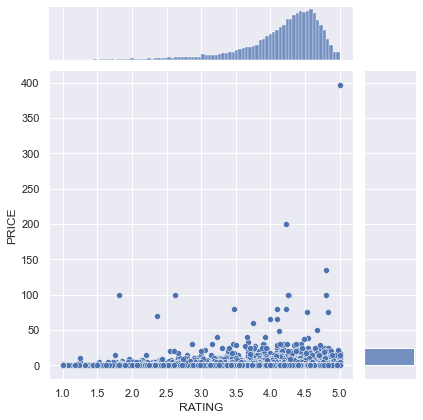

In [124]:
jointDF2 = df[["RATING", "PRICE"]]
sb.jointplot(data = jointDF2, x = "RATING", y = "PRICE", height = 6)

Let's observe closely to the distribution within price < 50

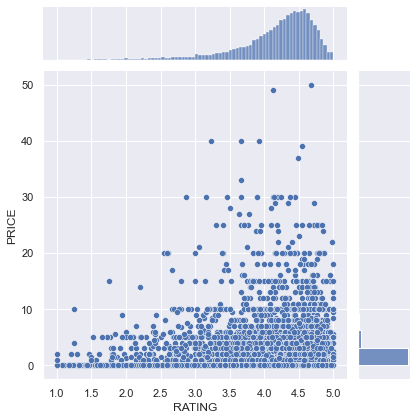

In [125]:
price_less_than_50 = df[df["PRICE"] < 50]
sb.jointplot(data = price_less_than_50, y = "PRICE", x = "RATING", height=6)

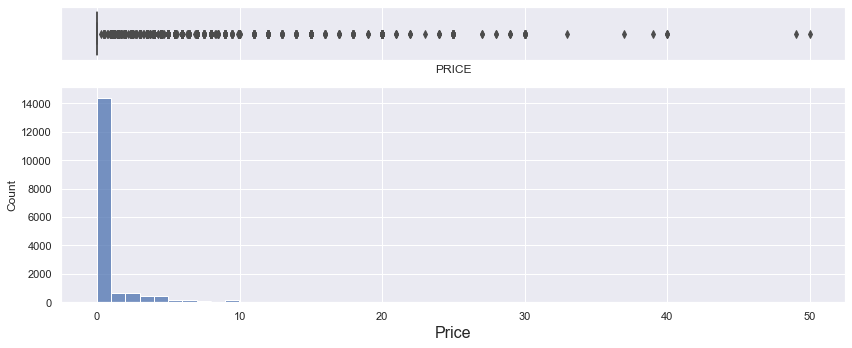

In [126]:
num_plots(price_less_than_50, "PRICE", "", "Price")

<AxesSubplot:xlabel='RATING', ylabel='PRICE'>

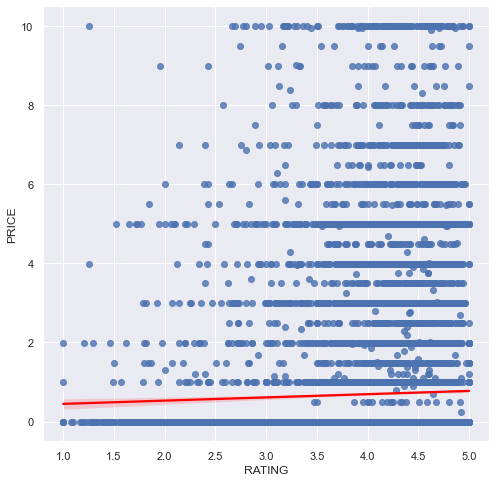

In [127]:
temp = df[df["PRICE"]<10]
plt.figure(figsize = (8, 8))
sb.regplot(y = "PRICE", x = "RATING", data = temp, line_kws={"color": "red"})

### FANG EDA

In [128]:
facebook_apps = df[df["APP_NAME"].str.contains("Facebook")]
amazon_apps = df[df["APP_NAME"].str.contains("Amazon")]
netflix_apps = df[df["APP_NAME"].str.contains("Netflix")]
google_apps = df[df["APP_NAME"].str.contains("Google")]

### How many apps did each company developed?


In [129]:
print("Facebook has developed", len(facebook_apps), "app(s).")
print("Amazon has developed", len(amazon_apps), "app(s).")
print("Netflix has developed", len(netflix_apps), "app(s).")
print("Google has developed", len(google_apps), "app(s).")

Facebook has developed 7 app(s).
Amazon has developed 17 app(s).
Netflix has developed 1 app(s).
Google has developed 52 app(s).


In [130]:
FANG = [facebook_apps, amazon_apps, netflix_apps, google_apps]
stringFANG = ["Facebook", "Amazon", "Netflix", "Google"]

### How's the app rating for the company?

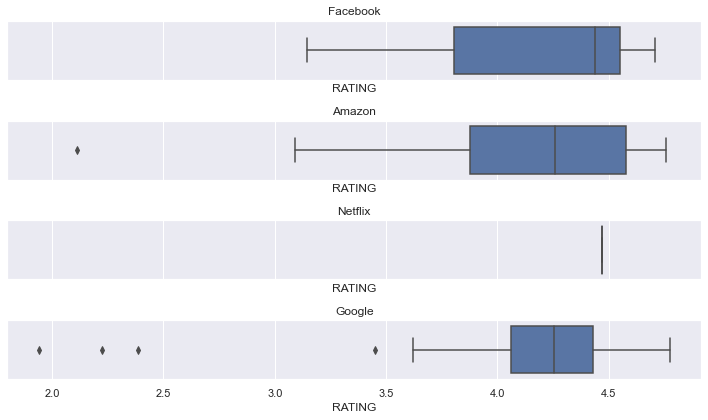

In [131]:
fig, axes = plt.subplots(4, 1, figsize = (10, 6), sharex = True)
x = 0
for i in FANG:
    sb.boxplot(data = i, x = "RATING", ax = axes[x])
    x += 1
x = 0 #reset
for i in stringFANG:
    axes[x].set_title(i)
    x += 1
x = 0 #reset
plt.tight_layout()


### What kind of apps do such great company develop?

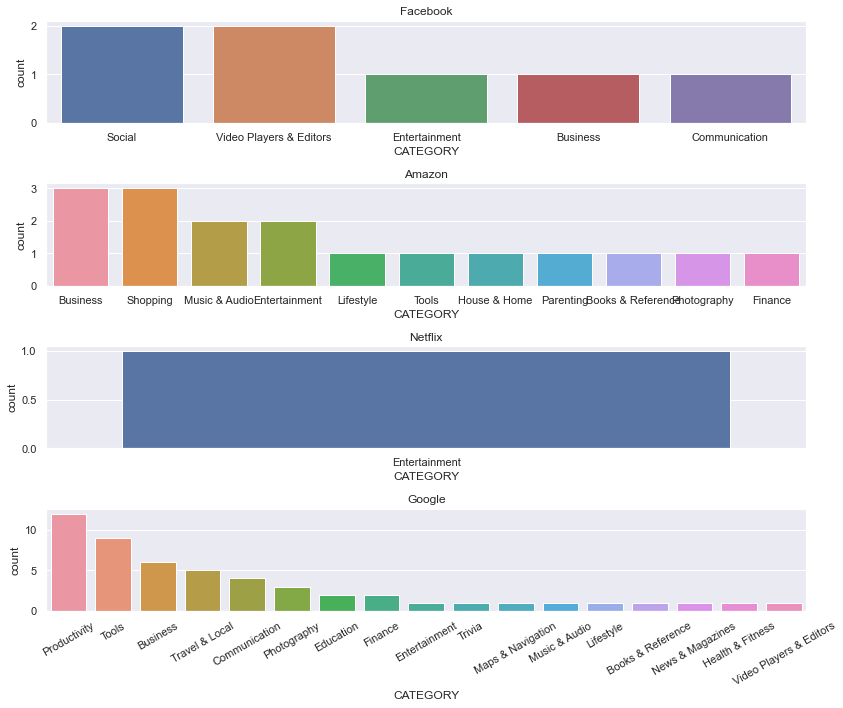

In [132]:
fig, axes = plt.subplots(4, 1, figsize = (12, 10))
x = 0
for i in FANG:
    sb.countplot(x = "CATEGORY", data = i, ax = axes[x] , order = i["CATEGORY"].value_counts().index)
    if (x == 3):
        plt.xticks(rotation = 30)
    x += 1
x = 0 #reset
for i in stringFANG:
    axes[x].set_title(i)
    x += 1
x = 0 #reset
plt.tight_layout()


### Let's find out how each category did in each company, shall we?

In [133]:
fb2 = facebook_apps.groupby(['CATEGORY'])['MAX_INSTALLS'].sum().reset_index()
amz2 = amazon_apps.groupby(['CATEGORY'])['MAX_INSTALLS'].sum().reset_index()
net2 = netflix_apps.groupby(['CATEGORY'])['MAX_INSTALLS'].sum().reset_index()
goog2 = google_apps.groupby(['CATEGORY'])['MAX_INSTALLS'].sum().reset_index()
FANG2 = [fb2, amz2, net2, goog2]

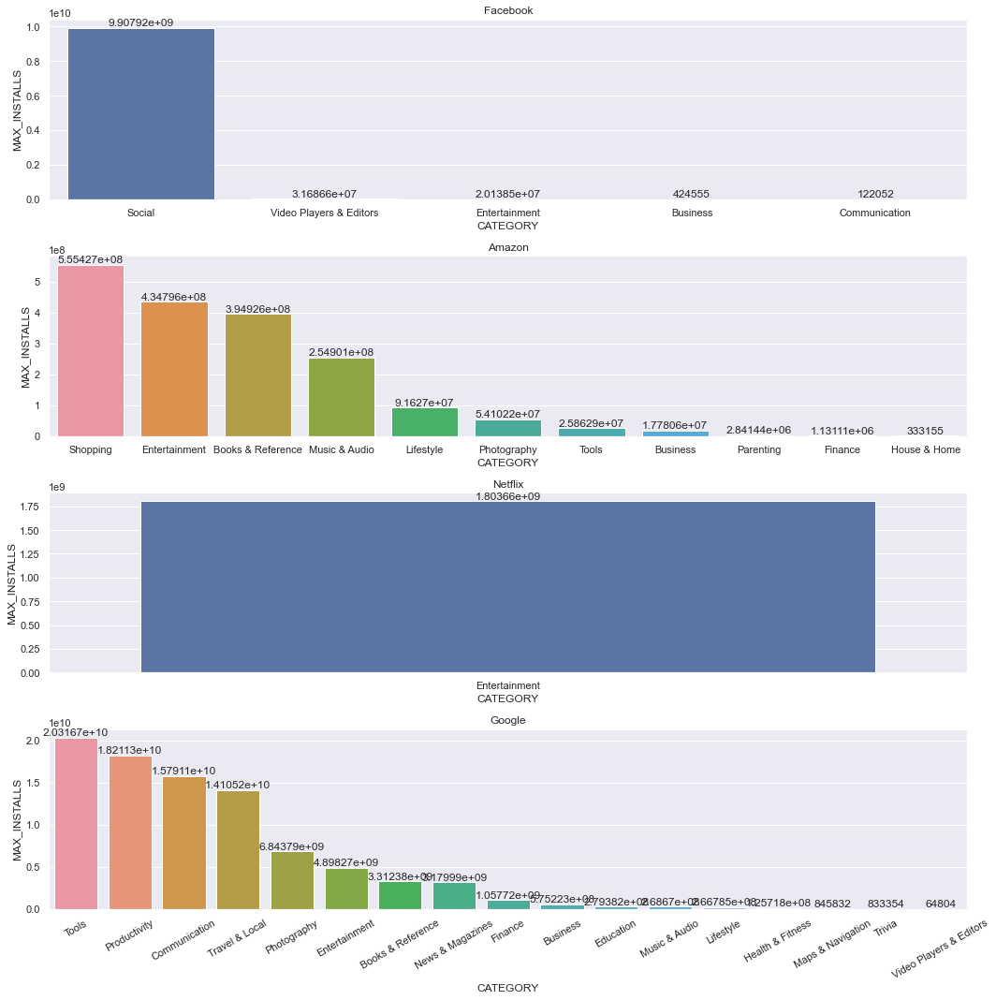

In [134]:
fig, axes = plt.subplots(4, 1, figsize = (15, 15))
x = 0
for i in FANG2:
    ax = sb.barplot(x = "CATEGORY", y = 'MAX_INSTALLS', data = i, ax = axes[x] , order = i.sort_values('MAX_INSTALLS', ascending = False).CATEGORY)
    ax.bar_label(ax.containers[0])
    if (x == 3):
        plt.xticks(rotation = 30)
    x += 1
x = 0 #reset
for i in stringFANG:
    axes[x].set_title(i)
    x += 1
x = 0 #reset
plt.tight_layout()

In fact, it's very intuitive that Facebook's most well-known app falls under the 'Social' category because Facebook is a social media platform. <br>
And Amazon is a e-shopping platform and Netflix is an entertainment platform.<br>And Google is the leading platform in tools, productivity and communication.

### Geospatial analysis

We will use the same dataset but will drop those rows without values in the COUNTRY column.

In [135]:
df = pd.read_csv("google_app_scrap_cleaned.csv")
df = df.dropna(subset=['COUNTRY'])

### 1. Comparing the average of max installs of the apps developed by each country.

In [136]:
max_installs_by_mean = pd.DataFrame(df.groupby(["COUNTRY"])["MAX_INSTALLS"].agg("mean"))
max_installs_by_mean.rename(columns={'MAX_INSTALLS': 'MEAN_MAX_INSTALLS'}, inplace = True)
max_installs_by_mean = max_installs_by_mean.nlargest(10,['MEAN_MAX_INSTALLS'])
max_installs_by_mean = max_installs_by_mean.reset_index()
max_installs_by_mean

,COUNTRY,MEAN_MAX_INSTALLS
0,Luxembourg,1.874039e+09
1,Usa,1.278689e+08
2,Ireland,7.368652e+07
3,South Korea,5.526386e+07
4,Oman,5.204643e+07
5,Singapore,4.960978e+07
6,Switzerland,4.265305e+07
7,Cyprus,3.512464e+07
8,France,2.950534e+07
9,Turkey,2.188303e+07


In [137]:
sequence = []
for i in range (1000,0,-100):
    sequence.append(i)
max_installs_by_mean['SIZE'] = sequence
max_installs_by_mean
max_installs_by_mean

,COUNTRY,MEAN_MAX_INSTALLS,SIZE
0,Luxembourg,1.874039e+09,1000
1,Usa,1.278689e+08,900
2,Ireland,7.368652e+07,800
3,South Korea,5.526386e+07,700
4,Oman,5.204643e+07,600
5,Singapore,4.960978e+07,500
6,Switzerland,4.265305e+07,400
7,Cyprus,3.512464e+07,300
8,France,2.950534e+07,200
9,Turkey,2.188303e+07,100


In [138]:
fig = px.bar(max_installs_by_mean, x='COUNTRY', y='MEAN_MAX_INSTALLS')
fig.show()

We have grouped the dataset by country and find their mean of max installs per country. Then we will proceed with picking the top 10 countries. <br>
Usa, South Korea, Singapore, France, Finland, China, Turkey and Hong Kong all remains on the list.

In [139]:
fig = px.scatter_geo(max_installs_by_mean, locations="COUNTRY", 
                     hover_name="COUNTRY", size = 'MEAN_MAX_INSTALLS',locationmode = 'country names')
fig.update_layout({
    'geo': {
        'resolution': 50
    }
})
fig.show()

### 2. Comparing the average rating of the apps developed by each country.
We will do the same thing, but this time we will explore on the rating.

In [140]:
rating_by_mean = pd.DataFrame(df.groupby(["COUNTRY"])["RATING"].agg("mean"))
rating_by_mean.rename(columns={'RATING': 'MEAN_RATING'}, inplace = True)

In [141]:
fig = px.box(rating_by_mean, x = "MEAN_RATING",points="all")
fig.show()

This figure gives us 2 types of visualizations, boxplot and swarmplot. Which provide us an insight where the majority of data lies in the rating spectrum. Which is 4 to 4.5. <br>
Notice there's a few outliers that have rating that are lower than 3.5. Let's find out which countries are those.

In [142]:
lowest_mean_rating = rating_by_mean[rating_by_mean['MEAN_RATING'] < 3.5]
lowest_mean_rating

,MEAN_RATING
COUNTRY,
Belize,3.288830
Iceland,3.462838
Morocco,2.936170
Uganda,2.200000


In [143]:
rating_by_mean = rating_by_mean.nlargest(10,['MEAN_RATING'])
rating_by_mean = rating_by_mean.reset_index()
rating_by_mean

,COUNTRY,MEAN_RATING
0,Montenegro,4.800969
1,Moldova,4.742574
2,Venezuela,4.670000
3,Albania,4.633178
4,Costa Rica,4.566433
5,Belarus,4.547344
6,Nepal,4.540000
7,Peru,4.535119
8,Tanzania,4.527273
9,Dominican Republic,4.511111


In [144]:
fig = px.bar(rating_by_mean, x='COUNTRY', y='MEAN_RATING')
fig.show()

In [145]:
rating_by_mean = rating_by_mean.nlargest(10,['MEAN_RATING'])
sequence = []
for i in range (1000,0,-100):
    sequence.append(i)
rating_by_mean['SIZE'] = sequence
rating_by_mean


,COUNTRY,MEAN_RATING,SIZE
0,Montenegro,4.800969,1000
1,Moldova,4.742574,900
2,Venezuela,4.670000,800
3,Albania,4.633178,700
4,Costa Rica,4.566433,600
5,Belarus,4.547344,500
6,Nepal,4.540000,400
7,Peru,4.535119,300
8,Tanzania,4.527273,200
9,Dominican Republic,4.511111,100


In [146]:
fig = px.scatter_geo(rating_by_mean, locations="COUNTRY", 
                     hover_name="COUNTRY", hover_data=["MEAN_RATING"], size = 'SIZE',locationmode = 'country names')
fig.update_layout({
    'geo': {
        'resolution': 50
    }
})
fig.show()

Compared to the previous map, this map's bubbles are more consistent and we can clearly see which bubble is bigger. Because we introduced a rank metric called SIZE which will change the bubble size according the ranking of the country instead of the mean ratings. 